## PCA/ICA on fragmented firing

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [382]:
import os
import cupy as cp
import numpy as np
import datajoint as dj
import spyglass as nd
import pandas as pd
import matplotlib.pyplot as plt
import json
import multiprocessing
import xarray as xr

# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

from spyglass.common import (Session, IntervalList,LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,LFPBand,interval_list_intersect)
from spyglass.common import TaskEpoch
import spyglass.spikesorting as ss

from spyglass.spikesorting.v0 import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,
                                   CuratedSpikeSortingSelection,CuratedSpikeSorting,Curation)

from spyglass.spikesorting.v0.spikesorting_curation import MetricParameters,MetricSelection,QualityMetrics
from spyglass.spikesorting.v0.spikesorting_curation import WaveformParameters,WaveformSelection,Waveforms
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection,IntervalLinearizedPosition

from spyglass.utils.nwb_helper_fn import get_nwb_copy_filename
from pprint import pprint
from spyglass.shijiegu.helpers import interval_union
from spyglass.shijiegu.load import load_run_sessions, load_decode, load_position
from spyglass.shijiegu.Analysis_SGU import RippleTimesWithDecode, TrialChoice, EpochPos, MUA
from spyglass.shijiegu.fragmented import find_spike_count_ratio
from spyglass.shijiegu.ripple_add_replay import plot_decode_spiking

In [174]:
from spyglass.shijiegu.singleUnit import session_unit, find_spikes, electrode_unit
from spyglass.shijiegu.placefield import place_field,placefield_to_peak1dloc
from spyglass.shijiegu.assembly import get_baseline, get_bins_ripple, get_binned_spikes, compute_assembly_vectors

In [4]:
pair=[[0,1],[0,2],[0,3],[1,2],[1,3],[2,3]]  #tetrode channel pairs
color_palet = np.array([[1,0.6,0],[0.7,0.6,0.4],[0.6,0.8,0.3],
                          [0,0.6,.3],[0,0,1],[0,0.6,1],[0,0.7,0.7],
                          [0.7,0,0.7],[0.7,0.4,1]]);
color_palet = color_palet[np.concatenate((np.arange(0,9,2),np.arange(1,9,2)))] # scramble slightly

### Specify date, session, and electrode

In [276]:
nwb_copy_file_name = "lewis20240109_.nwb"

In [277]:
run_session_ids, run_session_names, pos_session_names = load_run_sessions(nwb_copy_file_name)

*nwb_file_name *epoch    epoch_name     position_inter
+------------+ +-------+ +------------+ +------------+
lewis20240109_ 1         01_Rev2Sleep1  pos 0 valid ti
lewis20240109_ 2         02_Rev2Session pos 1 valid ti
lewis20240109_ 3         03_Rev2Sleep2  pos 2 valid ti
lewis20240109_ 4         04_Rev2Session pos 3 valid ti
lewis20240109_ 5         05_Rev2Sleep3  pos 4 valid ti
lewis20240109_ 6         06_Rev2Session pos 5 valid ti
lewis20240109_ 7         07_Rev2Sleep4  pos 6 valid ti
lewis20240109_ 8         08_Rev2Session pos 7 valid ti
lewis20240109_ 9         09_Rev2Sleep5  pos 8 valid ti
 (Total: 9)



In [278]:
epoch_num = 0
session_name = run_session_names[epoch_num]
pos_name = pos_session_names[epoch_num]

### 1. get spikes by event

In [279]:
log_df = pd.DataFrame(
        (TrialChoice & {'nwb_file_name':nwb_copy_file_name,
                        'epoch_name':session_name}).fetch1('choice_reward')
    )

In [280]:
try:
    ripple_times = pd.DataFrame((RippleTimesWithDecode & 
                                     {'nwb_file_name': nwb_copy_file_name, 'interval_list_name': session_name}).fetch1('ripple_times'))
except:
    ripple_times = pd.read_pickle((RippleTimesWithDecode & 
                                       {'nwb_file_name': nwb_copy_file_name, 'interval_list_name': session_name}).fetch1('ripple_times'))

In [281]:
list_of_bins_f, ripple_index_f = get_bins_ripple(
    nwb_copy_file_name, session_name, bin_width = 0.005, fragmented = True)

list_of_bins_c, ripple_index_c = get_bins_ripple(
    nwb_copy_file_name, session_name, bin_width = 0.005, fragmented = False)

In [282]:
(binned_spike_counts_zscore_f, nwb_units_all, cell_list) = get_binned_spikes(
    nwb_copy_file_name, session_name, list_of_bins_f, curation_id = 1, z_score = True)

binned_spike_counts_zscore_f = [np.mean(binned_spike_count, axis = 0).reshape((1,-1)) for binned_spike_count in binned_spike_counts_zscore_f]

[2025-05-20 15:34:03,042][WARNING]: Skipped checksum for file with hash: d397de4d-b956-a6b8-f13f-a720e0ffb49d, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_I5XI9DA3D8.nwb
[2025-05-20 15:34:03,056][WARNING]: Skipped checksum for file with hash: d397de4d-b956-a6b8-f13f-a720e0ffb49d, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_I5XI9DA3D8.nwb
[2025-05-20 15:34:03,064][WARNING]: Skipped checksum for file with hash: d397de4d-b956-a6b8-f13f-a720e0ffb49d, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_I5XI9DA3D8.nwb
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'ndx-franklab-novela' version 0.1.0 because version 0.2.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
[2025-05-20 15:34:12,637][WARNING]: Skipped checksum for file with hash: 7fa7a96b-96e8-bb28-2e8a-6aecb69b2400, and path: /stelmo/nwb/analysis/le

In [283]:
(binned_spike_counts_zscore_c, nwb_units_all, cell_list) = get_binned_spikes(
    nwb_copy_file_name, session_name, list_of_bins_c, curation_id = 1, z_score = True)

binned_spike_counts_zscore_c = [np.mean(binned_spike_count, axis = 0).reshape((1,-1)) for binned_spike_count in binned_spike_counts_zscore_c]

[2025-05-20 15:40:38,020][WARNING]: Skipped checksum for file with hash: d397de4d-b956-a6b8-f13f-a720e0ffb49d, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_I5XI9DA3D8.nwb
[2025-05-20 15:40:38,039][WARNING]: Skipped checksum for file with hash: d397de4d-b956-a6b8-f13f-a720e0ffb49d, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_I5XI9DA3D8.nwb
[2025-05-20 15:40:38,049][WARNING]: Skipped checksum for file with hash: d397de4d-b956-a6b8-f13f-a720e0ffb49d, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_I5XI9DA3D8.nwb
[2025-05-20 15:40:38,078][WARNING]: Skipped checksum for file with hash: 7fa7a96b-96e8-bb28-2e8a-6aecb69b2400, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_VBRYBZUX8E.nwb
[2025-05-20 15:40:38,101][WARNING]: Skipped checksum for file with hash: 7fa7a96b-96e8-bb28-2e8a-6aecb69b2400, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_VBRYBZUX8E.nwb
[2025-05-20 15:40:38,110][WARNING]: Skipped checksum for file with hash: 7f

In [324]:
list_of_bins = list_of_bins_c + list_of_bins_f
binned_t = [np.mean(t) for t in list_of_bins]

### visualize spike matrix

In [285]:
concatenated_ripple_ids = np.concatenate((ripple_index_c,ripple_index_f))

In [286]:
concatenated_spike_counts_c = np.concatenate(binned_spike_counts_zscore_c,axis = 0)
concatenated_spike_counts_f = np.concatenate(binned_spike_counts_zscore_f,axis = 0)
concatenated_spike_counts = np.hstack((concatenated_spike_counts_c.T, concatenated_spike_counts_f.T))
concatenated_spike_counts_label = np.concatenate((np.zeros(concatenated_spike_counts_c.shape[0]),np.ones(concatenated_spike_counts_f.shape[0])))

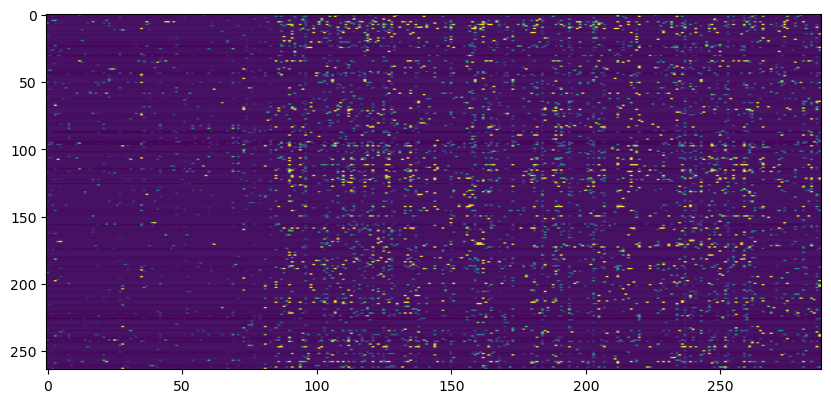

In [287]:
plt.subplots(ncols=1,nrows=1,figsize=(10,5))
plt.imshow(concatenated_spike_counts,aspect = 0.5,vmax = 3)

In [288]:
concatenated_spike_counts_nonan_ind = np.sum(np.isinf(concatenated_spike_counts),axis = 1) == 0
concatenated_spike_counts_nonan =concatenated_spike_counts[concatenated_spike_counts_nonan_ind,:]
cell_list_nonan = [cell_list[u] for u in np.argwhere(concatenated_spike_counts_nonan_ind).ravel()]

In [397]:
# for later plotting
neural_df = pd.DataFrame(data = concatenated_spike_counts_nonan.T, index=binned_t,columns=cell_list_nonan)
neural_df.index.name='time'
neural_df=xr.Dataset.from_dataframe(neural_df)

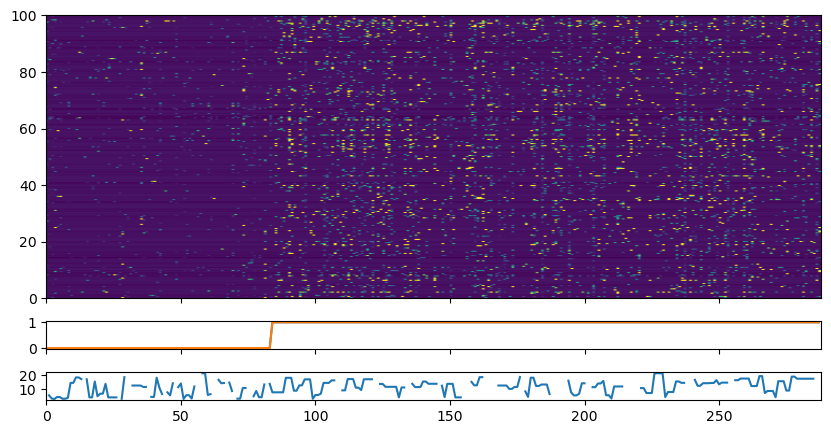

In [289]:
fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(10,5),height_ratios=[10, 1,1],sharex = True)
axes[0].imshow(concatenated_spike_counts_nonan,extent=[0, concatenated_spike_counts_nonan.shape[1], 0, 100],
               aspect = 'auto',vmax = 3)
axes[1].plot(concatenated_spike_counts_label)
axes[1].plot(concatenated_spike_counts_label)
axes[2].plot(np.array(ripple_times.loc[concatenated_ripple_ids].max_zscore))

In [290]:
ic_vectors, pc_vectors, eigenvalues, lambda_min, lambda_max, ic_assembly_activities = compute_assembly_vectors(
    concatenated_spike_counts_nonan)

print(ic_vectors.shape)
print(ic_assembly_activities.shape)

/home/shijiegu/Documents/spyglass/src/spyglass/shijiegu/assembly.py:153: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  """


(15, 264)
(15, 288)


In [417]:
def order_by_weight(ic_vectors):
    """
    ic_vectors: # of assembly x # of neurons 

    Returns:
    neurons_ind_all_assembly: ordering index
    neurons_labels_all_assembly: assembly that each neuron belongs to
    """
    # produce neuronal ordering
    assembly_membership = np.argmax(ic_vectors,axis = 0)
    
    # within each assembly, sort neurons by descreasing weight
    neurons_ind_all_assembly = []
    neurons_labels_all_assembly = []
    for ic_vector_ind in range(len(ic_vectors)):
        neurons_ind = np.argwhere(assembly_membership == ic_vector_ind).ravel()
        neurons_ind_all_assembly.append( neurons_ind[np.argsort(ic_vectors[ic_vector_ind,neurons_ind])] )
        neurons_labels_all_assembly.append(np.ones(len(neurons_ind)) * ic_vector_ind)
    neurons_ind_all_assembly = np.concatenate(neurons_ind_all_assembly)    
    neurons_labels_all_assembly = np.concatenate(neurons_labels_all_assembly)

    return neurons_ind_all_assembly, neurons_labels_all_assembly

In [418]:
neurons_ind_all_assembly, neurons_labels_all_assembly = order_by_weight(ic_vectors)
replay_ind_all_assembly, replay_labels_all_assembly = order_by_weight(ic_assembly_activities)

Text(0.5, 0, 'ripple intervals')

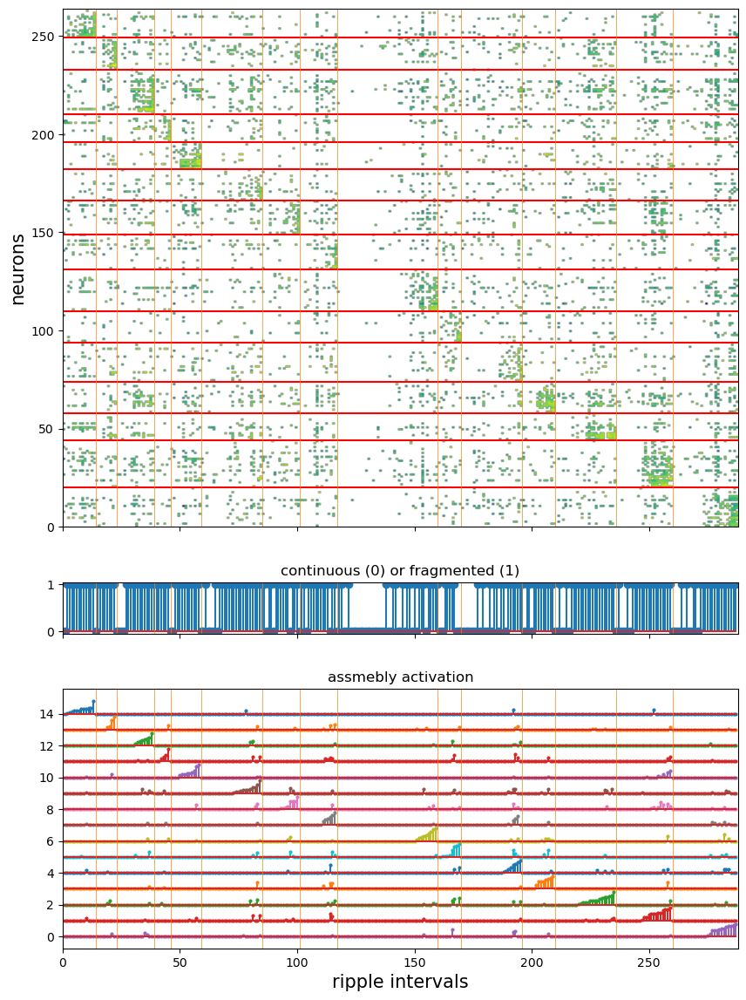

In [437]:
fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(10,14),height_ratios=[10, 1,5],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind_all_assembly,:][:,replay_ind_all_assembly]

axes[0].imshow(np.log(spike_counts_reordered),
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind_all_assembly)],
               #vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines
for row_ind in np.argwhere(np.diff(neurons_labels_all_assembly[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')
axes[0].set_ylabel('neurons',fontsize = 15) 

axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind_all_assembly])
axes[1].set_title("continuous (0) or fragmented (1)")



ind = len(ic_vectors) - 1
for ic_vector_ind in range(len(ic_vectors)):
    ic_assembly_activity = np.log(ic_assembly_activities[ic_vector_ind][replay_ind_all_assembly])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[2].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
                 (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(ic_vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[2].set_title("assmebly activation")
    axes[2].set_ylabel('')
    ind -= 1
axes[2].set_xlabel('ripple intervals')

# mark assembly vertical lines
for row_ind in np.argwhere(np.diff(replay_labels_all_assembly)).ravel():
    axes[0].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[1].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[2].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    
#plt.legend()
plt.xlabel('ripple intervals',fontsize = 15)

### Include some behavior information

In [462]:
trial_number = np.array(ripple_times.loc[concatenated_ripple_ids[replay_ind_all_assembly]].trial_number)
animal_location = np.array(ripple_times.loc[concatenated_ripple_ids[replay_ind_all_assembly]].animal_location)

In [466]:
loc2num = {"home":0,'center1':5,'center2':5,'center3':5,'center4':5,
           'well1':1,'well2':2,
          'well3':3,'well4':4,'arm0':0,'well0':0,
           'arm1':1,'arm2':2,
          'arm3':3,'arm4':4}

In [467]:
animal_location_num = [loc2num[l] for l in animal_location]

In [456]:
#log_df

In [457]:
OuterWellIndex = log_df.loc[trial_number].OuterWellIndex
current = log_df.loc[trial_number].current
future_H = log_df.loc[trial_number].future_H
future_O = log_df.loc[trial_number].future_O
past_reward = log_df.loc[trial_number].past_reward
past = log_df.loc[trial_number].past
rewardNum = log_df.loc[trial_number].rewardNum

Text(0.5, 0, 'ripple intervals')

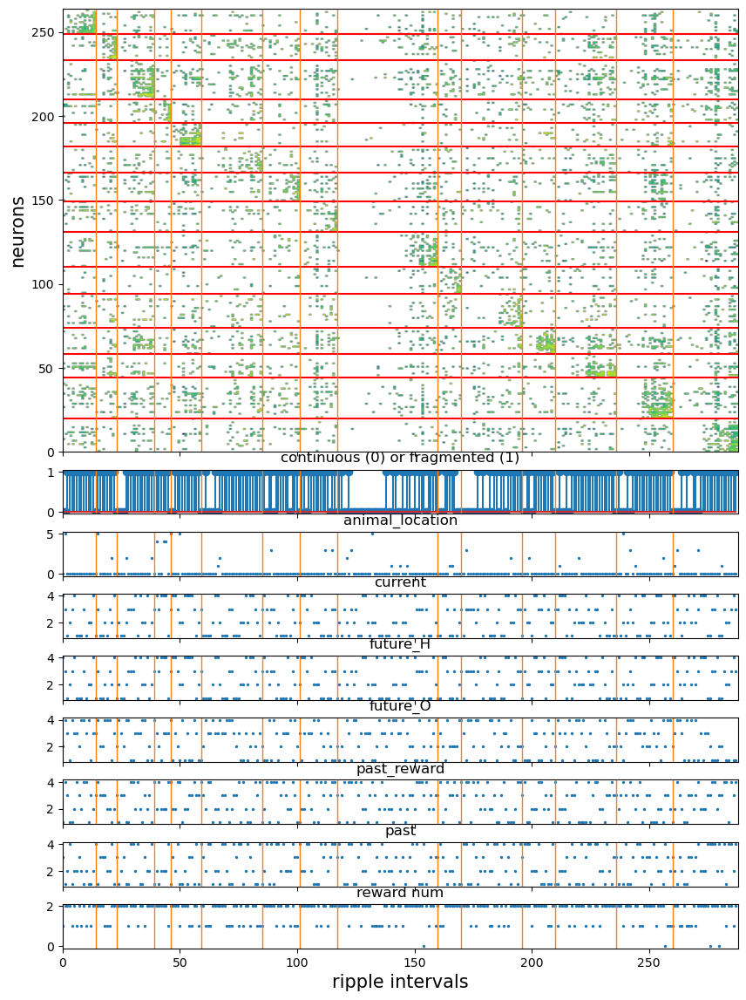

In [468]:
fig, axes = plt.subplots(ncols=1,nrows=9,figsize=(10,14),height_ratios=[10,1,1,1,1,1,1,1,1],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind_all_assembly,:][:,replay_ind_all_assembly]

axes[0].imshow(np.log(spike_counts_reordered),
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind_all_assembly)],
               #vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines
for row_ind in np.argwhere(np.diff(neurons_labels_all_assembly[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')
axes[0].set_ylabel('neurons',fontsize = 15) 

axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind_all_assembly])
axes[1].set_title("continuous (0) or fragmented (1)")

axes[2].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),animal_location_num,s = 2)
axes[2].set_title("animal_location")
axes[3].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),current,s = 2)
axes[3].set_title("current")
axes[4].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),future_H,s = 2)
axes[4].set_title("future_H")
axes[5].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),future_O,s = 2)
axes[5].set_title("future_O")
axes[6].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),past_reward,s = 2)
axes[6].set_title("past_reward")
axes[7].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),past,s = 2)
axes[7].set_title("past")
axes[8].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),rewardNum,s = 2)
axes[8].set_title("reward num")

# mark assembly vertical lines
for row_ind in np.argwhere(np.diff(replay_labels_all_assembly)).ravel():
    for axes_ind in range(9):
        axes[axes_ind].axvline(row_ind + 1,color = 'C1',linewidth = 1)
    
#plt.legend()
plt.xlabel('ripple intervals',fontsize = 15)

### Inspect decodes

In [366]:
# 2. load decode
encoding_set = "2Dheadspeed_above_4"
decoder_lk = "default_decoding_gpu_4armMaze_W20msO10ms"
decoder_ss = "default_decoding_gpu_4armMaze"

key_lk = {'nwb_file_name': nwb_copy_file_name,
          "encoding_set":encoding_set,"interval_list_name": session_name,
          "classifier_param_name": decoder_lk}

key_ss = {'nwb_file_name': nwb_copy_file_name,
          "encoding_set":encoding_set,"interval_list_name": session_name,
          "classifier_param_name": decoder_ss}


# load statescript decoder
decode_ss = load_decode(nwb_copy_file_name, session_name, key_ss["classifier_param_name"], encoding_set)
# load lk decoder
decode_lk = load_decode(nwb_copy_file_name, session_name, key_lk["classifier_param_name"], encoding_set)

In [374]:
# Load state script
key={'nwb_file_name':nwb_copy_file_name,'epoch':int(session_name[:2])}
log=(TrialChoice & key).fetch1('choice_reward')
epoch_name=(TrialChoice & key).fetch1('epoch_name')
epoch_pos_name = (EpochPos() & key).fetch1('position_interval')
print('epoch name',epoch_name)
print('epoch_pos_name',epoch_pos_name)
log_df=pd.DataFrame(log)

# load position
position_info=load_position(nwb_copy_file_name,epoch_pos_name)

head_speed=xr.Dataset.from_dataframe(pd.DataFrame(position_info['head_speed']))
head_orientation=xr.Dataset.from_dataframe(pd.DataFrame(position_info['head_orientation']))

# load linear position
linear_position_df = xr.Dataset.from_dataframe((IntervalLinearizedPosition() &
                          {'nwb_file_name': nwb_copy_file_name,
                           'interval_list_name': epoch_pos_name,
                           'position_info_param_name': 'default_decoding'}
                         ).fetch1_dataframe())

[2025-05-21 12:47:59,916][WARNING]: Skipped checksum for file with hash: 6cfcf895-2e2b-bb17-c3d1-9422e1618213, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_R4LWKFUE59.nwb
[2025-05-21 12:47:59,939][WARNING]: Skipped checksum for file with hash: 6cfcf895-2e2b-bb17-c3d1-9422e1618213, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_R4LWKFUE59.nwb
[2025-05-21 12:47:59,948][WARNING]: Skipped checksum for file with hash: 6cfcf895-2e2b-bb17-c3d1-9422e1618213, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_R4LWKFUE59.nwb
[12:47:59][WARNING] Spyglass: Deprecation: this class has been moved out of spyglass.common.common_position
	IntervalLinearizedPosition -> spyglass.linearization.v0.main.IntervalLinearizedPosition
Please use the new location.
	IntervalLinearizedPosition -> spyglass.linearization.v0.main.IntervalLinearizedPosition
Please use the new location.
[2025-05-21 12:48:00,003][WARNING]: Skipped checksum for file with hash: a0b23751-0c50-c10d-db95-1693

epoch name 02_Rev2Session1
epoch_pos_name pos 1 valid times


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'ndx-franklab-novela' version 0.1.0 because version 0.2.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


In [378]:
# MUA
mua_path=(MUA & {'nwb_file_name': nwb_copy_file_name,
                 'interval_list_name':session_name}).fetch1('mua_trace')
mua_xr = xr.open_dataset(mua_path)
mua_threshold=(MUA & {'nwb_file_name': nwb_copy_file_name,
                      'interval_list_name':session_name}).fetch1('mean')

In [352]:
ic_vector_ind = 5
ic_assembly_activity = ic_assembly_activities[ic_vector_ind]
ic_ripples = np.argwhere(ic_assembly_activity > np.quantile(ic_assembly_activity,0.95)).ravel()
print(ic_ripples)

[ 73  86  94 107 112 121 123 182 185 189 211 214 232 252 284]


In [353]:
concatenated_ripple_ids[ic_ripples]

array([153,  10,  15,  27,  31,  39,  41,  94,  95,  97, 119, 119, 132,
       148, 178])

In [384]:
i = 14
ripple_loc = concatenated_ripple_ids[ic_ripples[i]]
plottimes = [ripple_times.loc[ripple_loc].start_time,ripple_times.loc[ripple_loc].end_time]
print("ripple_loc = ", ripple_loc)
t0t1 = [list_of_bins[ic_ripples[i]][0],list_of_bins[ic_ripples[i]][1]]
print("t0t1 = [" + str(list_of_bins[ic_ripples[i]][0]) + "," + str(list_of_bins[ic_ripples[i]][-1]) + "]") #looking i th ripples's 5ms bins

ripple_loc =  178
t0t1 = [1704829907.340213,1704829907.3952143]


In [399]:
%debug

> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/pandas/core/indexes/base.py(570)__new__()
    568                 raise cls._raise_scalar_data_error(data) from err
    569             if "Data must be 1-dimensional" in str(err):
--> 570                 raise ValueError("Index data must be 1-dimensional") from err
    571             raise
    572         arr = ensure_wrapped_if_datetimelike(arr)



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/indexes.py(469)safe_cast_to_index()
    467                 kwargs["dtype"] = "float64"
    468 
--> 469         index = pd.Index(np.asarray(array), **kwargs)
    470 
    471     return _maybe_cast_to_cftimeindex(index)



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/indexes.py(582)__init__()
    580         # here or in other constructors (cannot use pd.Index.rename as this
    581         # constructor is also called from PandasMultiIndex)
--> 582         index = safe_cast_to_index(array).copy()
    583 
    584         if index.name is None:



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/dataset.py(7096)to_dataarray()
   7094         coords = {k: v.variable for k, v in self.coords.items()}
   7095         indexes = filter_indexes_from_coords(self._indexes, set(coords))
-> 7096         new_dim_index = PandasIndex(list(self.data_vars), dim)
   7097         indexes[dim] = new_dim_index
   7098         coords.update(new_dim_index.create_variables())



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/dataset.py(7106)to_array()
   7104     ) -> DataArray:
   7105         """Deprecated version of to_dataarray"""
-> 7106         return self.to_dataarray(dim=dim, name=name)
   7107 
   7108     def _normalize_dim_order(



ipdb>  u


> /home/shijiegu/Documents/spyglass/src/spyglass/shijiegu/ripple_add_replay.py(619)plot_decode_spiking()
    617                 axes[3].set_title('spiking, each row is a tetrode channel',size=10)
    618     elif plot_spiking == 2:
--> 619         spike_d=np.array(neural_subset.to_array()).astype('int32').T
    620         spike_t=np.array(neural_subset.time)
    621         axes[3].imshow(spike_d,extent=[0, spike_d.shape[1], 0, spike_d.shape[0]],



ipdb>  type(neural_subset)


<class 'xarray.core.dataset.Dataset'>


ipdb>  neural_subset


<xarray.Dataset> Size: 15kB
Dimensions:   (time: 7)
Coordinates:
  * time      (time) float64 56B 1.705e+09 1.705e+09 ... 1.705e+09 1.705e+09
Data variables: (12/264)
    (0, 3)    (time) float64 56B -0.1445 -0.1445 -0.1445 ... -0.1445 -0.1445
    (0, 4)    (time) float64 56B -0.1027 1.846 -0.1027 ... -0.1027 -0.1027
    (0, 5)    (time) float64 56B 1.494 -0.05697 -0.05697 ... -0.05697 -0.05697
    (0, 6)    (time) float64 56B -0.115 -0.115 -0.115 ... -0.115 -0.115 -0.115
    (0, 7)    (time) float64 56B -0.02091 -0.02091 ... -0.02091 -0.02091
    (0, 11)   (time) float64 56B -0.06554 -0.06554 ... -0.06554 -0.06554
    ...        ...
    (63, 3)   (time) float64 56B -0.05707 -0.05707 2.971 ... 1.503 -0.05707
    (63, 4)   (time) float64 56B -0.02777 -0.02777 ... -0.02777 -0.02777
    (63, 6)   (time) float64 56B -0.08669 -0.08669 ... -0.08669 -0.08669
    (63, 7)   (time) float64 56B -0.1172 -0.1172 -0.1172 ... -0.1172 -0.1172
    (63, 8)   (time) float64 56B -0.09236 -0.09236 1.152 ..

ipdb>  exit


no ripples during this time. None


ValueError: Index data must be 1-dimensional

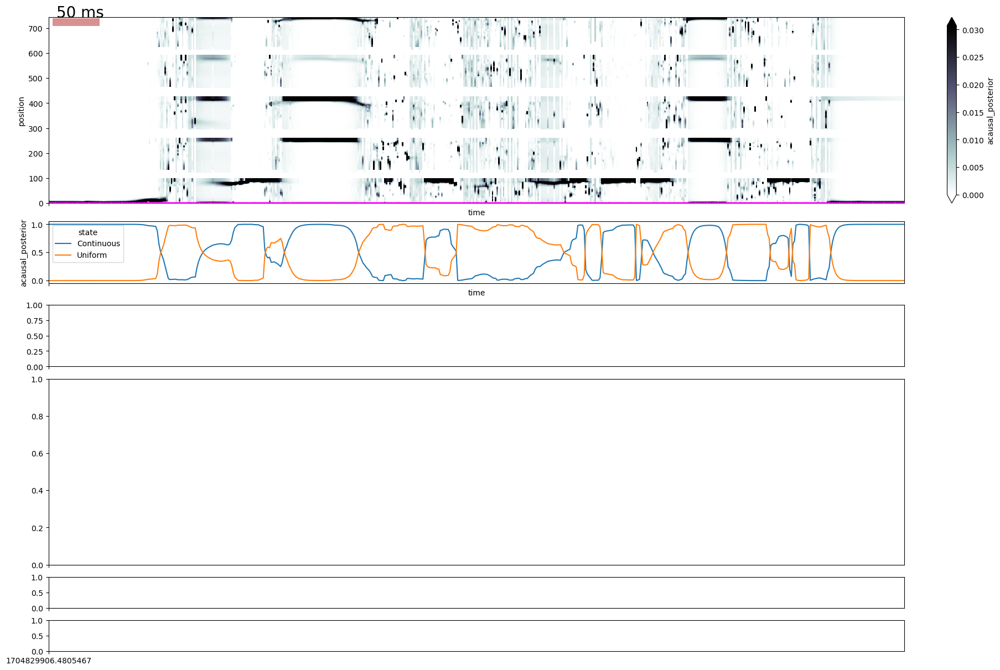

In [398]:
axes = plot_decode_spiking(plottimes,np.array(t0t1).reshape((1,-1)),linear_position_df,decode_ss,None,None,
                    neural_df,mua_xr,head_speed,head_orientation,
                    ripple_consensus_trace=None,plot_spiking=2,
                    title=None,savefolder=[],savename=None,
                    simple=True,tetrode2ind = None,mua_thresh = mua_threshold,
                    causal = False,likelihood = False)

In [309]:
ripple_times.loc[22:40]

,event_number,start_time,animal_location,trial_number,cont_intvl,frag_intvl,cont_intvl_replay,end_time,duration,mean_zscore,median_zscore,max_zscore,min_zscore,max_speed,min_speed,median_speed,mean_speed
22,23,1.704828e+09,home,10,"[[1704827805.9446096, 1704827806.0606096], [17...","[[1704827806.0626097, 1704827806.0846095], [17...","[[0], []]",1.704828e+09,0.320000,0.576956,-0.264985,5.487296,-1.118266,0.251573,0.251570,0.251571,0.251571
23,24,1.704828e+09,home,11,"[[1704827853.2546008, 1704827853.3906007], [17...","[[1704827853.4846003, 1704827853.568601]]","[[0], [], [0]]",1.704828e+09,0.392001,1.348274,0.335541,6.461219,-0.912350,2.914536,0.665200,2.093517,1.960921
24,25,1.704828e+09,home,11,"[[1704827854.5006003, 1704827854.8166003]]",[],[[2]],1.704828e+09,0.319000,0.235743,-0.047974,3.431542,-1.041691,0.032240,0.017477,0.032160,0.030509
25,26,1.704828e+09,home,11,"[[1704827855.8366, 1704827855.9826002], [17048...","[[1704827855.9846, 1704827856.1206002], [17048...","[[0, 2], [], [0], [1]]",1.704828e+09,0.687001,2.621669,1.468435,14.456226,-1.130427,0.032241,0.032240,0.032240,0.032240
26,27,1.704828e+09,well3,11,"[[1704827881.3105953, 1704827881.398595], [170...",[],"[[2], [1], [], [], []]",1.704828e+09,0.427001,2.705503,0.572529,18.491252,-1.021986,0.753646,0.441636,0.640561,0.592799
27,28,1.704828e+09,home,13,"[[1704827891.0265934, 1704827891.1605935], [17...","[[1704827891.1625936, 1704827891.2205937], [17...","[[], [], [], []]",1.704828e+09,0.447001,3.128186,0.988452,16.321646,-1.373073,0.853805,0.087524,0.477750,0.468394
28,29,1.704828e+09,home,13,"[[1704827893.282593, 1704827893.344593], [1704...","[[1704827893.424593, 1704827893.5045931], [170...","[[], [], [], []]",1.704828e+09,0.415000,NaN,NaN,NaN,NaN,0.866301,0.866292,0.866297,0.866297
29,30,1.704828e+09,home,14,"[[1704827925.072587, 1704827925.322587]]",[],[[0]],1.704828e+09,0.294000,NaN,NaN,NaN,NaN,6.639295,0.111995,1.024621,1.720802
30,31,1.704828e+09,home,14,"[[1704827926.5205867, 1704827926.6205869], [17...","[[1704827926.7065868, 1704827926.7545867], [17...","[[], [], [], [0]]",1.704828e+09,0.524001,1.943351,0.997000,8.924377,-0.769625,2.831223,0.396822,1.755325,1.708924
31,32,1.704828e+09,home,14,"[[1704827929.0725863, 1704827929.1805863], [17...","[[1704827929.1825864, 1704827929.2245862], [17...","[[0], [], [], [1]]",1.704828e+09,0.567001,3.783115,1.644853,17.295145,-0.771618,1.299201,1.299185,1.299192,1.299192


In [306]:
ripple_times.loc[concatenated_ripple_ids[ic_ripples]]

,event_number,start_time,animal_location,trial_number,cont_intvl,frag_intvl,cont_intvl_replay,end_time,duration,mean_zscore,median_zscore,max_zscore,min_zscore,max_speed,min_speed,median_speed,mean_speed
153,154,1.704829e+09,home,65,"[[1704829442.2223008, 1704829442.3263009], [17...",[],"[[0], [1], [1, 3]]",1.704829e+09,0.554001,1.165650,0.079092,10.652806,-1.249951,0.844217,0.844194,0.844211,0.844208
10,11,1.704828e+09,home,4,"[[1704827647.6866395, 1704827647.8066394], [17...","[[1704827647.8086395, 1704827647.8306394], [17...","[[], [], [], [], []]",1.704828e+09,0.626001,1.494009,0.935385,7.477777,-1.447481,0.765465,0.188312,0.438069,0.417336
15,16,1.704828e+09,home,6,"[[1704827694.3326306, 1704827694.4386306], [17...","[[1704827694.440631, 1704827694.4746306], [170...","[[0], []]",1.704828e+09,0.376000,1.294564,0.010583,12.630473,-1.062843,1.477374,1.477358,1.477364,1.477365
27,28,1.704828e+09,home,13,"[[1704827891.0265934, 1704827891.1605935], [17...","[[1704827891.1625936, 1704827891.2205937], [17...","[[], [], [], []]",1.704828e+09,0.447001,3.128186,0.988452,16.321646,-1.373073,0.853805,0.087524,0.477750,0.468394
31,32,1.704828e+09,home,14,"[[1704827929.0725863, 1704827929.1805863], [17...","[[1704827929.1825864, 1704827929.2245862], [17...","[[0], [], [], [1]]",1.704828e+09,0.567001,3.783115,1.644853,17.295145,-0.771618,1.299201,1.299185,1.299192,1.299192
39,40,1.704828e+09,home,17,"[[1704828012.0005708, 1704828012.0845706], [17...","[[1704828012.0865707, 1704828012.1945708], [17...","[[], [4], []]",1.704828e+09,0.721001,2.392725,0.426594,17.153100,-1.274336,0.868100,0.868091,0.868095,0.868095
41,42,1.704828e+09,home,18,"[[1704828034.0505664, 1704828034.1525664], [17...","[[1704828034.2205665, 1704828034.2605665], [17...","[[0], [], [], [], []]",1.704828e+09,0.539001,NaN,NaN,NaN,NaN,0.983419,0.983408,0.983412,0.983413
94,95,1.704829e+09,home,37,"[[1704828639.1264524, 1704828639.2384524], [17...","[[1704828639.2904522, 1704828639.3444524], [17...","[[0], [], [], []]",1.704829e+09,0.373000,2.212257,0.488558,12.170592,-0.770157,1.030343,1.030333,1.030339,1.030339
95,96,1.704829e+09,home,38,"[[1704828666.954447, 1704828667.078447], [1704...","[[1704828667.080447, 1704828667.3084471], [170...","[[], [], []]",1.704829e+09,0.566001,2.681025,1.938954,13.253388,-0.810432,0.967507,0.967497,0.967502,0.967502
97,98,1.704829e+09,home,39,"[[1704828692.3864422, 1704828692.4984422], [17...","[[1704828692.5004425, 1704828692.5904422], [17...","[[], []]",1.704829e+09,0.458001,NaN,NaN,NaN,NaN,0.814673,0.814665,0.814670,0.814669


In [274]:
log_df.loc[61:]

,timestamp_H,Home,timestamp_O,OuterWellIndex,rewardNum,current,future_H,future_O,past,past_reward


In [275]:
log_df.loc[np.array(
    ripple_times.loc[concatenated_ripple_ids[ic_ripples]].trial_number
)]

,timestamp_H,Home,timestamp_O,OuterWellIndex,rewardNum,current,future_H,future_O,past,past_reward
30,1.704925e+09,1.0,1.704925e+09,4.0,1.0,4.0,4.0,2.0,1.0,1.0
23,1.704925e+09,1.0,1.704925e+09,4.0,2.0,4.0,4.0,3.0,2.0,2.0
29,1.704925e+09,1.0,1.704925e+09,1.0,2.0,1.0,1.0,4.0,3.0,3.0


### Place field Sum by Assembly

In [269]:
cell_list_ = []  
placefields = {}
placefields_im = {}
mobility_spike_counts = {}
all_spike_counts = {}
peak_frs = {}
#count_ratios = {}

for row_ind in range(len(cell_list)):
    print(row_ind)
    e = cell_list[row_ind][0]
    u = cell_list[row_ind][1]
    
    
    nwb_units = electrode_unit(nwb_copy_file_name,session_name,e,curation_id=1)
    print(e,u)
    
    placefield_im, _, _1, _2, _3, _4 = place_field(
        nwb_copy_file_name, session_name, pos_name, e, u,
        curation_id = 1, nwb_units = nwb_units,
        immobility = True,
        normalize = False)
    
    placefield, peak_fr, xbins, ybins, mobility_spike_count, all_spike_count = place_field(
        nwb_copy_file_name, session_name, pos_name, e, u,
        curation_id = 1, nwb_units = nwb_units,
        immobility = False,
        normalize = True)
    if mobility_spike_count < 5:
        continue
    if all_spike_count > 20000:
        continue
        
    cell_list_.append((e,u))
    #count_ratios[(e,u)] = count_ratio[row_ind]
    
    placefields[(e,u)] = placefield
    placefields_im[(e,u)] = placefield_im
    peak_frs[(e,u)] = peak_fr
    mobility_spike_counts[(e,u)] = mobility_spike_count
    all_spike_counts[(e,u)] = all_spike_count

#cell_list = cell_list_

[2025-05-20 15:13:24,948][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:24,968][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:24,975][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:25,003][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:25,025][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:25,032][WARNING]: Skipped checksum for file with hash: 06

0
0 2
spike num: 2688


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'ndx-franklab-novela' version 0.1.0 because version 0.2.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
[2025-05-20 15:13:34,422][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:34,441][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:34,446][WARNING]: S

spike num: 2688
1


[2025-05-20 15:13:44,174][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:44,183][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:44,215][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,238][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,247][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,278][WARNING]: Skipped checksum for file with hash: ed

0 6
spike num: 1298
spike num: 1298


[2025-05-20 15:13:44,405][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,436][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,445][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,478][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:44,503][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:44,511][WARNING]: Skipped checksum for file with hash: ed

2
0 7
spike num: 176


[2025-05-20 15:13:44,864][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,888][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,896][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:44,928][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:44,952][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:44,960][WARNING]: Skipped checksum for file with hash: ed

spike num: 176
3


[2025-05-20 15:13:45,060][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:45,085][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:45,095][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:45,127][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,151][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,160][WARNING]: Skipped checksum for file with hash: 06

0 8
spike num: 1408
spike num: 1408


[2025-05-20 15:13:45,326][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,350][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,358][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,390][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:45,416][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:45,425][WARNING]: Skipped checksum for file with hash: ed

4
0 9
spike num: 188


[2025-05-20 15:13:45,769][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,788][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,793][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:45,818][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:45,837][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:45,845][WARNING]: Skipped checksum for file with hash: ed

spike num: 188
5


[2025-05-20 15:13:45,955][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:45,964][WARNING]: Skipped checksum for file with hash: 755b0a43-ca3f-05fc-5009-62d46fbdaab3, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_4QCYUBTHNY.nwb
[2025-05-20 15:13:45,998][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,023][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,032][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,064][WARNING]: Skipped checksum for file with hash: ed

0 10
spike num: 1730
spike num: 1730


[2025-05-20 15:13:46,194][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,220][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,228][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,261][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:46,284][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:46,294][WARNING]: Skipped checksum for file with hash: ed

6
0 12
spike num: 884


[2025-05-20 15:13:46,654][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,681][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,694][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,728][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:46,757][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:46,769][WARNING]: Skipped checksum for file with hash: ed

spike num: 884


[2025-05-20 15:13:46,866][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:46,893][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:46,903][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:46,935][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,962][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:46,971][WARNING]: Skipped checksum for file with hash: 06

7
7 5
spike num: 171


[2025-05-20 15:13:47,131][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,156][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,165][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,197][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:47,222][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:47,231][WARNING]: Skipped checksum for file with hash: ed

spike num: 171
8


[2025-05-20 15:13:47,319][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:47,344][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:47,354][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:47,387][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,412][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,421][WARNING]: Skipped checksum for file with hash: 06

7 6
spike num: 747
spike num: 747


[2025-05-20 15:13:47,579][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,604][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,612][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:47,644][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:47,669][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:47,678][WARNING]: Skipped checksum for file with hash: ed

9
7 9
spike num: 1148


[2025-05-20 15:13:48,029][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,054][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,062][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,095][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:48,119][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:48,127][WARNING]: Skipped checksum for file with hash: ed

spike num: 1148
10


[2025-05-20 15:13:48,216][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:48,242][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:48,252][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:48,284][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,309][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,318][WARNING]: Skipped checksum for file with hash: 06

7 11
spike num: 627
spike num: 627


[2025-05-20 15:13:48,474][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,499][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,508][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,540][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:48,565][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:48,574][WARNING]: Skipped checksum for file with hash: ed

11
7 12
spike num: 52


[2025-05-20 15:13:48,924][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,949][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,958][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:48,991][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:49,015][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:49,024][WARNING]: Skipped checksum for file with hash: ed

spike num: 52
12


[2025-05-20 15:13:49,110][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:49,136][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:49,146][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:49,180][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,205][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,214][WARNING]: Skipped checksum for file with hash: 06

7 13
spike num: 84
spike num: 84


[2025-05-20 15:13:49,371][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,395][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,404][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,437][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:49,460][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:49,468][WARNING]: Skipped checksum for file with hash: ed

13
7 16
spike num: 301


[2025-05-20 15:13:49,813][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,839][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,847][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:49,884][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:49,908][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:49,916][WARNING]: Skipped checksum for file with hash: ed

spike num: 301
14


[2025-05-20 15:13:50,007][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:50,032][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:50,042][WARNING]: Skipped checksum for file with hash: 4d08501e-aabc-2fbf-74a2-75eb0e9203a4, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_EACAHMBP28.nwb
[2025-05-20 15:13:50,076][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,101][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,110][WARNING]: Skipped checksum for file with hash: 06

7 17
spike num: 554
spike num: 554


[2025-05-20 15:13:50,262][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,287][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,296][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,328][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:50,351][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:50,359][WARNING]: Skipped checksum for file with hash: ed

15
8 4
spike num: 203


[2025-05-20 15:13:50,703][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,726][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,734][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,766][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:50,788][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:50,795][WARNING]: Skipped checksum for file with hash: ed

spike num: 203
16


[2025-05-20 15:13:50,881][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:50,899][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:50,905][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:50,927][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,945][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:50,950][WARNING]: Skipped checksum for file with hash: 06

8 5
spike num: 3663
spike num: 3663


[2025-05-20 15:13:51,111][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:51,142][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:51,166][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:51,174][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:51,269][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:51,293][WARNING]: Skipped checksum for file with hash: ea

17
8 7
spike num: 871


[2025-05-20 15:13:51,518][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:51,542][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:51,551][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:51,584][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:51,606][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:51,614][WARNING]: Skipped checksum for file with hash: ed

spike num: 871
18


[2025-05-20 15:13:51,706][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:51,731][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:51,741][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:51,775][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:51,800][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:51,809][WARNING]: Skipped checksum for file with hash: 06

8 8
spike num: 593
spike num: 593


[2025-05-20 15:13:51,976][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,001][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,011][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,045][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:52,071][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:52,080][WARNING]: Skipped checksum for file with hash: ed

19
8 9
spike num: 286


[2025-05-20 15:13:52,352][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:52,450][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,479][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,491][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,527][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:52,555][WARNING]: Skipped checksum for file with hash: ed

spike num: 286


[2025-05-20 15:13:52,656][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:52,685][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:52,698][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:52,742][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,772][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,782][WARNING]: Skipped checksum for file with hash: 06

20
8 10
spike num: 1917


[2025-05-20 15:13:52,842][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:52,853][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:52,939][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,955][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,963][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:52,987][WARNING]: Skipped checksum for file with hash: ed

spike num: 1917
21


[2025-05-20 15:13:53,133][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:53,142][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:53,176][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,199][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,208][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,239][WARNING]: Skipped checksum for file with hash: ed

8 11
spike num: 1210
spike num: 1210


[2025-05-20 15:13:53,361][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,385][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,394][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,426][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:53,450][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:53,460][WARNING]: Skipped checksum for file with hash: ed

22
8 16
spike num: 2415


[2025-05-20 15:13:53,812][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,836][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,844][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:53,876][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:53,900][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:53,908][WARNING]: Skipped checksum for file with hash: ed

spike num: 2415
23


[2025-05-20 15:13:54,000][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:54,024][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:54,034][WARNING]: Skipped checksum for file with hash: ea501654-8e45-fb49-11fb-7eafd217b316, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_QN68NK2LVH.nwb
[2025-05-20 15:13:54,068][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,093][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,101][WARNING]: Skipped checksum for file with hash: 06

8 17
spike num: 289
spike num: 289


[2025-05-20 15:13:54,259][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,284][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,293][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,326][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:54,351][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:54,359][WARNING]: Skipped checksum for file with hash: ed

24
9 2
spike num: 317


[2025-05-20 15:13:54,710][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,734][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,743][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,775][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:54,799][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:54,808][WARNING]: Skipped checksum for file with hash: ed

spike num: 317
25


[2025-05-20 15:13:54,895][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:54,920][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:54,930][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:54,964][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,989][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:54,997][WARNING]: Skipped checksum for file with hash: 06

9 3
spike num: 781
spike num: 781


[2025-05-20 15:13:55,157][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,182][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,192][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,225][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:55,249][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:55,258][WARNING]: Skipped checksum for file with hash: ed

26
9 4
spike num: 736


[2025-05-20 15:13:55,604][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,629][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,637][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,670][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:55,696][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:55,704][WARNING]: Skipped checksum for file with hash: ed

spike num: 736
27


[2025-05-20 15:13:55,794][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:55,821][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:55,830][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:55,864][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,887][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:55,896][WARNING]: Skipped checksum for file with hash: 06

9 5
spike num: 504
spike num: 504


[2025-05-20 15:13:56,060][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,084][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,093][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,125][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:56,150][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:56,159][WARNING]: Skipped checksum for file with hash: ed

28
9 6
spike num: 1009


[2025-05-20 15:13:56,507][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,532][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,541][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,573][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:56,597][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:56,605][WARNING]: Skipped checksum for file with hash: ed

spike num: 1009
29


[2025-05-20 15:13:56,694][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:56,720][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:56,729][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:56,763][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,788][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,797][WARNING]: Skipped checksum for file with hash: 06

9 7
spike num: 165
spike num: 165


[2025-05-20 15:13:56,950][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,975][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:56,983][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,015][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:57,040][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:57,049][WARNING]: Skipped checksum for file with hash: ed

30
9 8
spike num: 125


[2025-05-20 15:13:57,397][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,421][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,430][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,463][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:57,487][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:57,495][WARNING]: Skipped checksum for file with hash: ed

spike num: 125
31


[2025-05-20 15:13:57,583][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:57,608][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:57,618][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:57,652][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,677][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,685][WARNING]: Skipped checksum for file with hash: 06

9 9
spike num: 457
spike num: 457


[2025-05-20 15:13:57,839][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,864][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,873][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:57,904][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:57,928][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:57,937][WARNING]: Skipped checksum for file with hash: ed

32
9 12
spike num: 339


[2025-05-20 15:13:58,239][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,263][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,271][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,303][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:58,328][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:58,335][WARNING]: Skipped checksum for file with hash: ed

spike num: 339
33


[2025-05-20 15:13:58,424][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:58,449][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:58,460][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:58,494][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,520][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,529][WARNING]: Skipped checksum for file with hash: 06

9 13
spike num: 418
spike num: 418


[2025-05-20 15:13:58,687][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,712][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,720][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:58,752][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:58,776][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:58,784][WARNING]: Skipped checksum for file with hash: ed

34
9 16
spike num: 1734


[2025-05-20 15:13:59,130][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,155][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,164][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,197][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:59,222][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:59,230][WARNING]: Skipped checksum for file with hash: ed

spike num: 1734
35


[2025-05-20 15:13:59,323][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:59,348][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:59,358][WARNING]: Skipped checksum for file with hash: 0dbc773c-3dc7-f911-f36a-e689daf5dcb6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8A968NQQ0S.nwb
[2025-05-20 15:13:59,393][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,418][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,427][WARNING]: Skipped checksum for file with hash: 06

9 17
spike num: 1802
spike num: 1802


[2025-05-20 15:13:59,580][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,605][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,613][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:13:59,645][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:59,670][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:13:59,678][WARNING]: Skipped checksum for file with hash: ed

36
12 2
spike num: 157


[2025-05-20 15:14:00,030][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,056][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,065][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,097][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:00,122][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:00,131][WARNING]: Skipped checksum for file with hash: ed

spike num: 157
37


[2025-05-20 15:14:00,218][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:00,244][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:00,254][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:00,288][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,314][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,323][WARNING]: Skipped checksum for file with hash: 06

12 4
spike num: 259
spike num: 259


[2025-05-20 15:14:00,480][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,504][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,513][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,545][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:00,570][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:00,578][WARNING]: Skipped checksum for file with hash: ed

38
12 5
spike num: 672


[2025-05-20 15:14:00,929][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,952][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,961][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:00,992][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:01,016][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:01,024][WARNING]: Skipped checksum for file with hash: ed

spike num: 672
39


[2025-05-20 15:14:01,112][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:01,136][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:01,145][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:01,175][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,198][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,206][WARNING]: Skipped checksum for file with hash: 06

12 10
spike num: 748
spike num: 748


[2025-05-20 15:14:01,351][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,374][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,382][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,412][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:01,435][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:01,443][WARNING]: Skipped checksum for file with hash: ed

40
12 11
spike num: 267


[2025-05-20 15:14:01,786][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,810][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,819][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:01,850][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:01,873][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:01,881][WARNING]: Skipped checksum for file with hash: ed

spike num: 267
41


[2025-05-20 15:14:01,969][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:01,993][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:02,002][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:02,034][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,058][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,066][WARNING]: Skipped checksum for file with hash: 06

12 12
spike num: 412
spike num: 412


[2025-05-20 15:14:02,216][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,240][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,248][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,280][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:02,304][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:02,313][WARNING]: Skipped checksum for file with hash: ed

42
12 13
spike num: 2511


[2025-05-20 15:14:02,649][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,674][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,682][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,716][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:02,741][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:02,749][WARNING]: Skipped checksum for file with hash: ed

spike num: 2511
43


[2025-05-20 15:14:02,842][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:02,869][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:02,879][WARNING]: Skipped checksum for file with hash: 031cd89a-36b4-0c1f-d6bd-8de7ee592c6c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_B6B73TXHRV.nwb
[2025-05-20 15:14:02,912][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,937][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:02,946][WARNING]: Skipped checksum for file with hash: 06

12 14
spike num: 375
spike num: 375


[2025-05-20 15:14:03,104][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,129][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,137][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,162][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:03,179][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:03,186][WARNING]: Skipped checksum for file with hash: ed

44
12 15
spike num: 194


[2025-05-20 15:14:03,527][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,552][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,560][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,592][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:03,616][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:03,625][WARNING]: Skipped checksum for file with hash: ed

spike num: 194
45


[2025-05-20 15:14:03,711][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:03,735][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:03,744][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:03,775][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,798][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,807][WARNING]: Skipped checksum for file with hash: 06

13 4
spike num: 799
spike num: 799


[2025-05-20 15:14:03,955][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,978][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:03,987][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,018][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:04,041][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:04,049][WARNING]: Skipped checksum for file with hash: ed

46
13 5
spike num: 903


[2025-05-20 15:14:04,375][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,397][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,405][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,435][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:04,458][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:04,466][WARNING]: Skipped checksum for file with hash: ed

spike num: 903
47


[2025-05-20 15:14:04,556][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:04,579][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:04,589][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:04,621][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,644][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,652][WARNING]: Skipped checksum for file with hash: 06

13 6
spike num: 320
spike num: 320


[2025-05-20 15:14:04,800][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,822][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,831][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:04,861][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:04,884][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:04,892][WARNING]: Skipped checksum for file with hash: ed

48
13 12
spike num: 4000


[2025-05-20 15:14:05,234][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,257][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,266][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,296][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:05,319][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:05,327][WARNING]: Skipped checksum for file with hash: ed

spike num: 4000
49


[2025-05-20 15:14:05,418][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:05,427][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:05,459][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,484][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,492][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,524][WARNING]: Skipped checksum for file with hash: ed

13 15
spike num: 104
spike num: 104


[2025-05-20 15:14:05,645][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,670][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,678][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:05,710][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:05,735][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:05,743][WARNING]: Skipped checksum for file with hash: ed

50
13 17
spike num: 304


[2025-05-20 15:14:06,088][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,112][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,120][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,152][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:06,176][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:06,184][WARNING]: Skipped checksum for file with hash: ed

spike num: 304
51


[2025-05-20 15:14:06,271][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:06,296][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:06,306][WARNING]: Skipped checksum for file with hash: df1b5947-ea6a-0404-5c9a-0878f498385e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FQIRYFVJUJ.nwb
[2025-05-20 15:14:06,337][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,358][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,366][WARNING]: Skipped checksum for file with hash: 06

13 18
spike num: 744
spike num: 744


[2025-05-20 15:14:06,536][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,544][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,573][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:06,596][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:06,604][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:06,694][WARNING]: Skipped checksum for file with hash: dd

52
15 2
spike num: 752


[2025-05-20 15:14:06,951][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,974][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:06,983][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,015][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:07,039][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:07,048][WARNING]: Skipped checksum for file with hash: ed

spike num: 752
53


[2025-05-20 15:14:07,137][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:07,163][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:07,173][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:07,207][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,233][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,241][WARNING]: Skipped checksum for file with hash: 06

15 4
spike num: 129
spike num: 129


[2025-05-20 15:14:07,381][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,404][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,412][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,443][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:07,466][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:07,475][WARNING]: Skipped checksum for file with hash: ed

54
15 6
spike num: 1149


[2025-05-20 15:14:07,826][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,850][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,859][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:07,891][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:07,916][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:07,924][WARNING]: Skipped checksum for file with hash: ed

spike num: 1149
55


[2025-05-20 15:14:08,012][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:08,038][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:08,048][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:08,082][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,107][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,115][WARNING]: Skipped checksum for file with hash: 06

15 8
spike num: 1423
spike num: 1423


[2025-05-20 15:14:08,269][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,288][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,295][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,319][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:08,336][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:08,342][WARNING]: Skipped checksum for file with hash: ed

56
15 9
spike num: 308


[2025-05-20 15:14:08,649][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,674][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,683][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,715][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:08,739][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:08,747][WARNING]: Skipped checksum for file with hash: ed

spike num: 308
57


[2025-05-20 15:14:08,835][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:08,861][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:08,870][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:08,904][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,928][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:08,937][WARNING]: Skipped checksum for file with hash: 06

15 10
spike num: 756
spike num: 756


[2025-05-20 15:14:09,094][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,119][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,128][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,159][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:09,184][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:09,193][WARNING]: Skipped checksum for file with hash: ed

58
15 11
spike num: 392


[2025-05-20 15:14:09,461][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:09,556][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,580][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,589][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,622][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:09,647][WARNING]: Skipped checksum for file with hash: ed

spike num: 392
59


[2025-05-20 15:14:09,742][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:09,768][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:09,778][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:09,812][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,837][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:09,846][WARNING]: Skipped checksum for file with hash: 06

15 14
spike num: 1923
spike num: 1923


[2025-05-20 15:14:10,000][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,025][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,035][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,068][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:10,093][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:10,102][WARNING]: Skipped checksum for file with hash: ed

60
15 15
spike num: 345


[2025-05-20 15:14:10,454][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,479][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,488][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,519][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:10,544][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:10,553][WARNING]: Skipped checksum for file with hash: ed

spike num: 345
61


[2025-05-20 15:14:10,640][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:10,667][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:10,676][WARNING]: Skipped checksum for file with hash: ddd6f65f-341a-183e-6320-8f131c754710, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_XYN7UDK43J.nwb
[2025-05-20 15:14:10,710][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,735][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,744][WARNING]: Skipped checksum for file with hash: 06

15 18
spike num: 115
spike num: 115


[2025-05-20 15:14:10,897][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,922][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,931][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:10,963][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:10,987][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:10,996][WARNING]: Skipped checksum for file with hash: ed

62
15 19
spike num: 361


[2025-05-20 15:14:11,347][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,371][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,380][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,412][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:11,436][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:11,444][WARNING]: Skipped checksum for file with hash: ed

spike num: 361
63


[2025-05-20 15:14:11,532][WARNING]: Skipped checksum for file with hash: 4518741f-bc84-2f38-8dce-5782e16fefbd, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_SQ3V51Q5B0.nwb
[2025-05-20 15:14:11,558][WARNING]: Skipped checksum for file with hash: 4518741f-bc84-2f38-8dce-5782e16fefbd, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_SQ3V51Q5B0.nwb
[2025-05-20 15:14:11,568][WARNING]: Skipped checksum for file with hash: 4518741f-bc84-2f38-8dce-5782e16fefbd, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_SQ3V51Q5B0.nwb
[2025-05-20 15:14:11,602][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,627][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,636][WARNING]: Skipped checksum for file with hash: 06

19 11
spike num: 874
spike num: 874


[2025-05-20 15:14:11,795][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,820][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,830][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:11,864][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:11,888][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:11,897][WARNING]: Skipped checksum for file with hash: ed

64
19 16
spike num: 185


[2025-05-20 15:14:12,253][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,279][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,288][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,322][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:12,348][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:12,357][WARNING]: Skipped checksum for file with hash: ed

spike num: 185
65


[2025-05-20 15:14:12,445][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:12,472][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:12,482][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:12,517][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,542][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,550][WARNING]: Skipped checksum for file with hash: 06

20 5
spike num: 62
spike num: 62


[2025-05-20 15:14:12,708][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,733][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,742][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:12,776][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:12,800][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:12,809][WARNING]: Skipped checksum for file with hash: ed

66
20 9
spike num: 1214


[2025-05-20 15:14:13,165][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,191][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,200][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,233][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:13,258][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:13,267][WARNING]: Skipped checksum for file with hash: ed

spike num: 1214
67


[2025-05-20 15:14:13,358][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:13,383][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:13,392][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:13,418][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,436][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,443][WARNING]: Skipped checksum for file with hash: 06

20 10
spike num: 606
spike num: 606


[2025-05-20 15:14:13,616][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,628][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:13,665][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:13,693][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:13,704][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:13,801][WARNING]: Skipped checksum for file with hash: ba

68
20 11
spike num: 605


[2025-05-20 15:14:13,982][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:14,078][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,103][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,113][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,147][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:14,173][WARNING]: Skipped checksum for file with hash: ed

spike num: 605
69


[2025-05-20 15:14:14,273][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:14,300][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:14,311][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:14,345][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,371][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,380][WARNING]: Skipped checksum for file with hash: 06

20 18
spike num: 880


[2025-05-20 15:14:14,547][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,573][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,583][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,617][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:14,644][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:14,653][WARNING]: Skipped checksum for file with hash: ed

spike num: 880
70


[2025-05-20 15:14:14,747][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:14,773][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:14,785][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:14,820][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,846][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:14,856][WARNING]: Skipped checksum for file with hash: 06

20 19
spike num: 337


[2025-05-20 15:14:15,024][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,050][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,060][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,095][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:15,120][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:15,129][WARNING]: Skipped checksum for file with hash: ed

spike num: 337
71


[2025-05-20 15:14:15,222][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:15,249][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:15,259][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:15,294][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,319][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,328][WARNING]: Skipped checksum for file with hash: 06

20 20
spike num: 1158


[2025-05-20 15:14:15,496][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,520][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,530][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,564][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:15,590][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:15,599][WARNING]: Skipped checksum for file with hash: ed

spike num: 1158
72


[2025-05-20 15:14:15,693][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:15,720][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:15,730][WARNING]: Skipped checksum for file with hash: ba294ed7-01ef-79f1-96a2-301729c5d34c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JAR97B8BCY.nwb
[2025-05-20 15:14:15,764][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,789][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,798][WARNING]: Skipped checksum for file with hash: 06

20 22
spike num: 848
spike num: 848


[2025-05-20 15:14:15,962][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,987][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:15,996][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,029][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,054][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,063][WARNING]: Skipped checksum for file with hash: ed

73
21 2
spike num: 69


[2025-05-20 15:14:16,411][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,438][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,446][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,477][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,496][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,502][WARNING]: Skipped checksum for file with hash: ed

spike num: 69
74


[2025-05-20 15:14:16,589][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:16,620][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,644][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,652][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,683][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,707][WARNING]: Skipped checksum for file with hash: ed

21 3
spike num: 558
spike num: 558


[2025-05-20 15:14:16,802][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,826][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,835][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:16,866][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,891][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:16,899][WARNING]: Skipped checksum for file with hash: ed

75
21 5
spike num: 254


[2025-05-20 15:14:17,243][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,268][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,277][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,310][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:17,335][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:17,343][WARNING]: Skipped checksum for file with hash: ed

spike num: 254
76


[2025-05-20 15:14:17,431][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:17,457][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:17,466][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:17,500][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,525][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,535][WARNING]: Skipped checksum for file with hash: 06

21 6
spike num: 162
spike num: 162


[2025-05-20 15:14:17,685][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,709][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,718][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:17,749][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:17,772][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:17,780][WARNING]: Skipped checksum for file with hash: ed

77
21 7
spike num: 526


[2025-05-20 15:14:18,128][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,153][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,162][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,194][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:18,219][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:18,227][WARNING]: Skipped checksum for file with hash: ed

spike num: 526
78


[2025-05-20 15:14:18,315][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:18,341][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:18,351][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:18,385][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,410][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,419][WARNING]: Skipped checksum for file with hash: 06

21 8
spike num: 599
spike num: 599


[2025-05-20 15:14:18,561][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,577][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,584][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:18,610][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:18,636][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:18,644][WARNING]: Skipped checksum for file with hash: ed

79
21 12
spike num: 472


[2025-05-20 15:14:18,990][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,014][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,023][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,055][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:19,080][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:19,089][WARNING]: Skipped checksum for file with hash: ed

spike num: 472
80


[2025-05-20 15:14:19,178][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:19,205][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:19,215][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:19,249][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,274][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,283][WARNING]: Skipped checksum for file with hash: 06

21 14
spike num: 623
spike num: 623


[2025-05-20 15:14:19,435][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,460][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,468][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,501][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:19,525][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:19,534][WARNING]: Skipped checksum for file with hash: ed

81
21 15
spike num: 132


[2025-05-20 15:14:19,889][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,914][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,923][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:19,955][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:19,980][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:19,988][WARNING]: Skipped checksum for file with hash: ed

spike num: 132
82


[2025-05-20 15:14:20,079][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:20,104][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:20,113][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:20,146][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,170][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,179][WARNING]: Skipped checksum for file with hash: 06

21 17
spike num: 1803
spike num: 1803


[2025-05-20 15:14:20,331][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,356][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,364][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,396][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:20,418][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:20,426][WARNING]: Skipped checksum for file with hash: ed

83
21 18
spike num: 1537


[2025-05-20 15:14:20,777][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,801][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,809][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:20,840][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:20,863][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:20,870][WARNING]: Skipped checksum for file with hash: ed

spike num: 1537
84


[2025-05-20 15:14:20,966][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:20,991][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:21,001][WARNING]: Skipped checksum for file with hash: 445a0763-bbca-eec9-4f60-a0554c41751a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OEB3HTXHCX.nwb
[2025-05-20 15:14:21,034][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,058][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,067][WARNING]: Skipped checksum for file with hash: 06

21 19
spike num: 1052
spike num: 1052


[2025-05-20 15:14:21,217][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,241][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,250][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,281][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:21,305][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:21,313][WARNING]: Skipped checksum for file with hash: ed

85
21 20
spike num: 142


[2025-05-20 15:14:21,634][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,658][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,666][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,698][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:21,721][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:21,729][WARNING]: Skipped checksum for file with hash: ed

spike num: 142
86


[2025-05-20 15:14:21,817][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:21,842][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:21,851][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:21,884][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,907][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:21,916][WARNING]: Skipped checksum for file with hash: 06

23 7
spike num: 311
spike num: 311


[2025-05-20 15:14:22,068][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,092][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,100][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,132][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:22,155][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:22,163][WARNING]: Skipped checksum for file with hash: ed

87
23 8
spike num: 461


[2025-05-20 15:14:22,509][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,532][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,540][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,572][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:22,595][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:22,604][WARNING]: Skipped checksum for file with hash: ed

spike num: 461
88


[2025-05-20 15:14:22,693][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:22,717][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:22,726][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:22,759][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,783][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,791][WARNING]: Skipped checksum for file with hash: 06

23 9
spike num: 687
spike num: 687


[2025-05-20 15:14:22,941][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,964][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:22,973][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:23,004][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:23,027][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:23,035][WARNING]: Skipped checksum for file with hash: ed

89
23 10
spike num: 3807


[2025-05-20 15:14:23,379][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:23,401][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:23,410][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:23,440][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:23,463][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:23,470][WARNING]: Skipped checksum for file with hash: ed

spike num: 3807
90


[2025-05-20 15:14:23,568][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:23,592][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:23,602][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:23,627][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:23,643][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:23,650][WARNING]: Skipped checksum for file with hash: 06

23 15
spike num: 76
spike num: 76


[2025-05-20 15:14:23,820][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:23,827][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:23,913][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:23,936][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:23,945][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:23,976][WARNING]: Skipped checksum for file with hash: 06

91
23 16
spike num: 244


[2025-05-20 15:14:24,164][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,188][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,197][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,229][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:24,253][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:24,261][WARNING]: Skipped checksum for file with hash: ed

spike num: 244
92


[2025-05-20 15:14:24,347][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:24,373][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:24,382][WARNING]: Skipped checksum for file with hash: d4269c28-6d33-f778-09b9-6a4bca8af253, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNEJS9Y5MV.nwb
[2025-05-20 15:14:24,415][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,439][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,448][WARNING]: Skipped checksum for file with hash: 06

23 20
spike num: 1677
spike num: 1677


[2025-05-20 15:14:24,602][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,626][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,635][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:24,667][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:24,691][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:24,699][WARNING]: Skipped checksum for file with hash: ed

93
24 3
spike num: 2645


[2025-05-20 15:14:25,045][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,068][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,076][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,106][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:25,129][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:25,137][WARNING]: Skipped checksum for file with hash: ed

spike num: 2645
94


[2025-05-20 15:14:25,229][WARNING]: Skipped checksum for file with hash: 7ee3408d-cb1c-4771-c5db-d47232ae9f8f, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_7PIW80QKCZ.nwb
[2025-05-20 15:14:25,253][WARNING]: Skipped checksum for file with hash: 7ee3408d-cb1c-4771-c5db-d47232ae9f8f, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_7PIW80QKCZ.nwb
[2025-05-20 15:14:25,262][WARNING]: Skipped checksum for file with hash: 7ee3408d-cb1c-4771-c5db-d47232ae9f8f, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_7PIW80QKCZ.nwb
[2025-05-20 15:14:25,293][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,316][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,324][WARNING]: Skipped checksum for file with hash: 06

24 5
spike num: 1585
spike num: 1585


[2025-05-20 15:14:25,472][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,496][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,505][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,535][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:25,558][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:25,566][WARNING]: Skipped checksum for file with hash: ed

95
25 4
spike num: 316


[2025-05-20 15:14:25,904][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,928][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,936][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:25,971][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:25,994][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:26,003][WARNING]: Skipped checksum for file with hash: ed

spike num: 316
96


[2025-05-20 15:14:26,092][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:26,118][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:26,128][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:26,160][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,182][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,191][WARNING]: Skipped checksum for file with hash: 06

25 5
spike num: 355
spike num: 355


[2025-05-20 15:14:26,337][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,360][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,368][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,400][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:26,424][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:26,433][WARNING]: Skipped checksum for file with hash: ed

97
25 6
spike num: 462


[2025-05-20 15:14:26,780][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,803][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,810][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:26,842][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:26,865][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:26,872][WARNING]: Skipped checksum for file with hash: ed

spike num: 462
98


[2025-05-20 15:14:26,959][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:26,984][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:26,993][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:27,024][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,061][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,069][WARNING]: Skipped checksum for file with hash: 06

25 15
spike num: 280
spike num: 280


[2025-05-20 15:14:27,221][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,245][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,254][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,285][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:27,308][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:27,316][WARNING]: Skipped checksum for file with hash: ed

99
25 17
spike num: 713


[2025-05-20 15:14:27,638][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,663][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,671][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,702][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:27,726][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:27,733][WARNING]: Skipped checksum for file with hash: ed

spike num: 713
100


[2025-05-20 15:14:27,821][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:27,846][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:27,855][WARNING]: Skipped checksum for file with hash: a0678384-5706-e305-86f4-b49a7d3d81d9, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1MBL6QS8MU.nwb
[2025-05-20 15:14:27,887][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,911][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:27,921][WARNING]: Skipped checksum for file with hash: 06

25 18
spike num: 708
spike num: 708


[2025-05-20 15:14:28,079][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,104][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,113][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,146][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:28,171][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:28,180][WARNING]: Skipped checksum for file with hash: ed

101
27 2
spike num: 3719


[2025-05-20 15:14:28,527][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,551][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,559][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,590][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:28,612][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:28,621][WARNING]: Skipped checksum for file with hash: ed

spike num: 3719
102


[2025-05-20 15:14:28,717][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:28,741][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:28,750][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:28,773][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,790][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:28,797][WARNING]: Skipped checksum for file with hash: 06

27 3
spike num: 462
spike num: 462


[2025-05-20 15:14:28,987][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,010][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,019][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,110][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:29,134][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:29,143][WARNING]: Skipped checksum for file with hash: 18

103
27 5
spike num: 317


[2025-05-20 15:14:29,369][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,394][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,403][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,436][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,461][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,470][WARNING]: Skipped checksum for file with hash: ed

spike num: 317
104


[2025-05-20 15:14:29,558][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:29,584][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:29,593][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:29,631][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,655][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,663][WARNING]: Skipped checksum for file with hash: 06

27 6
spike num: 339
spike num: 339


[2025-05-20 15:14:29,811][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,834][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,842][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:29,876][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,900][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:29,908][WARNING]: Skipped checksum for file with hash: ed

105
27 7
spike num: 635


[2025-05-20 15:14:30,255][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,280][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,289][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,321][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:30,346][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:30,354][WARNING]: Skipped checksum for file with hash: ed

spike num: 635
106


[2025-05-20 15:14:30,444][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:30,470][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:30,479][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:30,513][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,538][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,546][WARNING]: Skipped checksum for file with hash: 06

27 8
spike num: 863
spike num: 863


[2025-05-20 15:14:30,706][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,730][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,739][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:30,771][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:30,794][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:30,802][WARNING]: Skipped checksum for file with hash: ed

107
27 10
spike num: 161


[2025-05-20 15:14:31,143][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,168][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,176][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,208][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:31,231][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:31,240][WARNING]: Skipped checksum for file with hash: ed

spike num: 161
108


[2025-05-20 15:14:31,326][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:31,350][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:31,359][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:31,392][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,415][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,424][WARNING]: Skipped checksum for file with hash: 06

27 11
spike num: 283
spike num: 283


[2025-05-20 15:14:31,573][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,597][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,605][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:31,636][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:31,660][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:31,668][WARNING]: Skipped checksum for file with hash: ed

109
27 12
spike num: 252


[2025-05-20 15:14:32,012][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,036][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,044][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,075][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:32,099][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:32,107][WARNING]: Skipped checksum for file with hash: ed

spike num: 252
110


[2025-05-20 15:14:32,194][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:32,218][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:32,228][WARNING]: Skipped checksum for file with hash: 1819a459-2c10-f6dc-798e-5469a806190a, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_GNTXFJA7BZ.nwb
[2025-05-20 15:14:32,260][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,283][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,292][WARNING]: Skipped checksum for file with hash: 06

27 17
spike num: 662
spike num: 662


[2025-05-20 15:14:32,438][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,462][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,471][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,503][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:32,527][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:32,536][WARNING]: Skipped checksum for file with hash: ed

111
27 18
spike num: 4559


[2025-05-20 15:14:32,886][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,911][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,920][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:32,951][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:32,974][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:32,982][WARNING]: Skipped checksum for file with hash: ed

spike num: 4559
112


[2025-05-20 15:14:33,074][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:33,098][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:33,107][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:33,140][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,164][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,172][WARNING]: Skipped checksum for file with hash: 06

29 6
spike num: 2502
spike num: 2502


[2025-05-20 15:14:33,326][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,351][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,359][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,391][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:33,414][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:33,422][WARNING]: Skipped checksum for file with hash: ed

113
29 9
spike num: 469


[2025-05-20 15:14:33,774][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,798][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,807][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:33,839][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:33,862][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:33,869][WARNING]: Skipped checksum for file with hash: ed

spike num: 469
114


[2025-05-20 15:14:33,963][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:33,972][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:34,003][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,026][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,035][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,066][WARNING]: Skipped checksum for file with hash: ed

29 11
spike num: 445
spike num: 445


[2025-05-20 15:14:34,184][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,208][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,216][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,247][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:34,271][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:34,279][WARNING]: Skipped checksum for file with hash: ed

115
29 12
spike num: 689


[2025-05-20 15:14:34,622][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,645][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,654][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,686][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:34,709][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:34,717][WARNING]: Skipped checksum for file with hash: ed

spike num: 689
116


[2025-05-20 15:14:34,816][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:34,840][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:34,850][WARNING]: Skipped checksum for file with hash: 95bf7a97-57de-f435-e380-ab5ee39dcfee, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_NKAVBSQMPP.nwb
[2025-05-20 15:14:34,883][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,907][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:34,915][WARNING]: Skipped checksum for file with hash: 06

29 13
spike num: 226
spike num: 226


[2025-05-20 15:14:35,068][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,092][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,101][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,132][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:35,156][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:35,164][WARNING]: Skipped checksum for file with hash: ed

117
31 12
spike num: 145


[2025-05-20 15:14:35,512][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,535][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,544][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,575][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:35,599][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:35,607][WARNING]: Skipped checksum for file with hash: ed

spike num: 145
118


[2025-05-20 15:14:35,695][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:35,719][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:35,728][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:35,760][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,783][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,792][WARNING]: Skipped checksum for file with hash: 06

32 4
spike num: 2656
spike num: 2656


[2025-05-20 15:14:35,949][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,972][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:35,981][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,012][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:36,036][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:36,044][WARNING]: Skipped checksum for file with hash: ed

119
32 6
spike num: 1901


[2025-05-20 15:14:36,400][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,424][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,433][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,466][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:36,490][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:36,498][WARNING]: Skipped checksum for file with hash: ed

spike num: 1901
120


[2025-05-20 15:14:36,586][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:36,612][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:36,622][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:36,654][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,678][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,687][WARNING]: Skipped checksum for file with hash: 06

32 7
spike num: 467
spike num: 467


[2025-05-20 15:14:36,842][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,867][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,875][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:36,907][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:36,931][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:36,939][WARNING]: Skipped checksum for file with hash: ed

121
32 8
spike num: 187


[2025-05-20 15:14:37,249][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,273][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,282][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,314][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:37,338][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:37,346][WARNING]: Skipped checksum for file with hash: ed

spike num: 187
122


[2025-05-20 15:14:37,433][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:37,458][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:37,468][WARNING]: Skipped checksum for file with hash: c28babd6-2532-2a61-0f68-1010066832bb, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_P0WRPIOSIG.nwb
[2025-05-20 15:14:37,501][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,524][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,533][WARNING]: Skipped checksum for file with hash: 06

32 11
spike num: 184
spike num: 184


[2025-05-20 15:14:37,686][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,711][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,719][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:37,750][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:37,775][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:37,783][WARNING]: Skipped checksum for file with hash: ed

123
32 12
spike num: 464


[2025-05-20 15:14:38,130][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,155][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,164][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,196][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:38,221][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:38,230][WARNING]: Skipped checksum for file with hash: ed

spike num: 464
124


[2025-05-20 15:14:38,317][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:38,341][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:38,350][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:38,384][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,409][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,417][WARNING]: Skipped checksum for file with hash: 06

35 2
spike num: 524
spike num: 524


[2025-05-20 15:14:38,572][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,597][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,605][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:38,637][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:38,662][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:38,670][WARNING]: Skipped checksum for file with hash: ed

125
35 3
spike num: 455


[2025-05-20 15:14:39,014][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,038][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,046][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,078][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:39,102][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:39,110][WARNING]: Skipped checksum for file with hash: ed

spike num: 455
126


[2025-05-20 15:14:39,199][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:39,224][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:39,234][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:39,266][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,290][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,299][WARNING]: Skipped checksum for file with hash: 06

35 5
spike num: 2857
spike num: 2857


[2025-05-20 15:14:39,454][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,479][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,487][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,518][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:39,542][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:39,551][WARNING]: Skipped checksum for file with hash: ed

127
35 9
spike num: 293


[2025-05-20 15:14:39,904][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,928][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,937][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:39,969][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:39,994][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:40,003][WARNING]: Skipped checksum for file with hash: ed

spike num: 293
128


[2025-05-20 15:14:40,090][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:40,115][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:40,124][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:40,156][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,179][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,187][WARNING]: Skipped checksum for file with hash: 06

35 10
spike num: 66
spike num: 66


[2025-05-20 15:14:40,332][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,355][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,363][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,394][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:40,417][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:40,425][WARNING]: Skipped checksum for file with hash: ed

129
35 11
spike num: 650


[2025-05-20 15:14:40,765][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,788][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,796][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:40,827][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:40,850][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:40,858][WARNING]: Skipped checksum for file with hash: ed

spike num: 650
130


[2025-05-20 15:14:40,946][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:40,971][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:40,980][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:41,012][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,035][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,044][WARNING]: Skipped checksum for file with hash: 06

35 12
spike num: 471
spike num: 471


[2025-05-20 15:14:41,190][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,215][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,223][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,254][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:41,277][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:41,285][WARNING]: Skipped checksum for file with hash: ed

131
35 13
spike num: 122


[2025-05-20 15:14:41,625][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,648][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,656][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,686][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:41,710][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:41,718][WARNING]: Skipped checksum for file with hash: ed

spike num: 122
132


[2025-05-20 15:14:41,805][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:41,830][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:41,839][WARNING]: Skipped checksum for file with hash: 755c1b3c-0ac3-6475-34ba-2ad7b5cc5da6, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_TI102STRS9.nwb
[2025-05-20 15:14:41,870][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,894][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:41,902][WARNING]: Skipped checksum for file with hash: 06

35 14
spike num: 55
spike num: 55


[2025-05-20 15:14:42,049][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,073][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,080][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,110][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:42,132][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:42,139][WARNING]: Skipped checksum for file with hash: ed

133
35 16
spike num: 1888


[2025-05-20 15:14:42,478][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,503][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,511][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,542][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:42,564][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:42,572][WARNING]: Skipped checksum for file with hash: ed

spike num: 1888
134


[2025-05-20 15:14:42,661][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:42,685][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:42,695][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:42,727][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,750][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,759][WARNING]: Skipped checksum for file with hash: 06

37 3
spike num: 219
spike num: 219


[2025-05-20 15:14:42,904][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,927][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,935][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:42,965][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:42,988][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:42,997][WARNING]: Skipped checksum for file with hash: ed

135
37 4
spike num: 1116


[2025-05-20 15:14:43,339][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,362][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,371][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,406][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:43,430][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:43,438][WARNING]: Skipped checksum for file with hash: ed

spike num: 1116
136


[2025-05-20 15:14:43,526][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:43,550][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:43,559][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:43,591][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,616][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,624][WARNING]: Skipped checksum for file with hash: 06

37 5
spike num: 114
spike num: 114


[2025-05-20 15:14:43,769][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,792][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,801][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:43,831][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:43,854][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:43,863][WARNING]: Skipped checksum for file with hash: ed

137
37 6
spike num: 190


[2025-05-20 15:14:44,195][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,212][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,220][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,248][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:44,272][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:44,280][WARNING]: Skipped checksum for file with hash: ed

spike num: 190
138


[2025-05-20 15:14:44,392][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:44,402][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:44,435][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,460][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,469][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,501][WARNING]: Skipped checksum for file with hash: ed

37 7
spike num: 94
spike num: 94


[2025-05-20 15:14:44,622][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,648][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,656][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:44,687][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:44,712][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:44,720][WARNING]: Skipped checksum for file with hash: ed

139
37 8
spike num: 318


[2025-05-20 15:14:45,080][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,104][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,113][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,146][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:45,171][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:45,179][WARNING]: Skipped checksum for file with hash: ed

spike num: 318
140


[2025-05-20 15:14:45,265][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:45,290][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:45,300][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:45,333][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,358][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,367][WARNING]: Skipped checksum for file with hash: 06

37 9
spike num: 180
spike num: 180


[2025-05-20 15:14:45,526][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,549][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,558][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,591][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:45,616][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:45,624][WARNING]: Skipped checksum for file with hash: ed

141
37 10
spike num: 449


[2025-05-20 15:14:45,971][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:45,996][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,005][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,037][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:46,062][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:46,071][WARNING]: Skipped checksum for file with hash: ed

spike num: 449
142


[2025-05-20 15:14:46,159][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:46,186][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:46,195][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:46,229][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,254][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,263][WARNING]: Skipped checksum for file with hash: 06

37 13
spike num: 300
spike num: 300


[2025-05-20 15:14:46,413][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,438][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,447][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,479][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:46,503][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:46,512][WARNING]: Skipped checksum for file with hash: ed

143
37 14
spike num: 320


[2025-05-20 15:14:46,863][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,889][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,898][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:46,930][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:46,956][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:46,964][WARNING]: Skipped checksum for file with hash: ed

spike num: 320
144


[2025-05-20 15:14:47,053][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:47,078][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:47,088][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:47,122][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,147][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,155][WARNING]: Skipped checksum for file with hash: 06

37 15
spike num: 355
spike num: 355


[2025-05-20 15:14:47,302][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,334][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:47,357][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:47,366][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:47,458][WARNING]: Skipped checksum for file with hash: 15a31211-cb49-cac0-8e99-f98b6cf6f4de, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_2Z61IIHHX3.nwb
[2025-05-20 15:14:47,484][WARNING]: Skipped checksum for file with hash: 15

145
37 17
spike num: 395


[2025-05-20 15:14:47,720][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,745][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,754][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,787][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:47,811][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:47,820][WARNING]: Skipped checksum for file with hash: ed

spike num: 395
146


[2025-05-20 15:14:47,907][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:47,932][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:47,941][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:47,974][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:47,997][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,006][WARNING]: Skipped checksum for file with hash: 06

39 2
spike num: 453
spike num: 453


[2025-05-20 15:14:48,154][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,178][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,186][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,218][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:48,242][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:48,250][WARNING]: Skipped checksum for file with hash: ed

147
39 3
spike num: 213


[2025-05-20 15:14:48,594][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,618][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,627][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,658][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:48,682][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:48,690][WARNING]: Skipped checksum for file with hash: ed

spike num: 213
148


[2025-05-20 15:14:48,778][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:48,803][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:48,812][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:48,844][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,868][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:48,876][WARNING]: Skipped checksum for file with hash: 06

39 4
spike num: 790
spike num: 790


[2025-05-20 15:14:49,028][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,052][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,061][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,092][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:49,116][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:49,125][WARNING]: Skipped checksum for file with hash: ed

149
39 5
spike num: 1396


[2025-05-20 15:14:49,465][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,486][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,494][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,523][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:49,546][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:49,553][WARNING]: Skipped checksum for file with hash: ed

spike num: 1396
150


[2025-05-20 15:14:49,663][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:49,672][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:49,703][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,727][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,735][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,767][WARNING]: Skipped checksum for file with hash: ed

39 6
spike num: 488
spike num: 488


[2025-05-20 15:14:49,881][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,904][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,912][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:49,941][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:49,964][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:49,972][WARNING]: Skipped checksum for file with hash: ed

151
39 9
spike num: 1948


[2025-05-20 15:14:50,317][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,340][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,348][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,378][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:50,402][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:50,410][WARNING]: Skipped checksum for file with hash: ed

spike num: 1948
152


[2025-05-20 15:14:50,500][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:50,524][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:50,534][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:50,564][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,587][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,595][WARNING]: Skipped checksum for file with hash: 06

39 10
spike num: 611
spike num: 611


[2025-05-20 15:14:50,742][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,766][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,776][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:50,808][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:50,832][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:50,840][WARNING]: Skipped checksum for file with hash: ed

153
39 11
spike num: 1209


[2025-05-20 15:14:51,192][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,216][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,225][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,257][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:51,281][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:51,289][WARNING]: Skipped checksum for file with hash: ed

spike num: 1209
154


[2025-05-20 15:14:51,378][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:51,404][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:51,414][WARNING]: Skipped checksum for file with hash: f0268eb6-db46-3e79-8a25-fdacaffb488d, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_REMIV4CL5N.nwb
[2025-05-20 15:14:51,447][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,472][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,481][WARNING]: Skipped checksum for file with hash: 06

39 12
spike num: 1328
spike num: 1328


[2025-05-20 15:14:51,634][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,659][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,667][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:51,701][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:51,725][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:51,734][WARNING]: Skipped checksum for file with hash: ed

155
39 15
spike num: 96


[2025-05-20 15:14:52,083][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,108][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,116][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,148][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:52,171][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:52,180][WARNING]: Skipped checksum for file with hash: ed

spike num: 96
156


[2025-05-20 15:14:52,266][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:52,292][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:52,302][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:52,336][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,360][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,367][WARNING]: Skipped checksum for file with hash: 06

40 2
spike num: 452
spike num: 452


[2025-05-20 15:14:52,517][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,541][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,549][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,581][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:52,605][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:52,614][WARNING]: Skipped checksum for file with hash: ed

157
40 3
spike num: 213


[2025-05-20 15:14:52,961][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,986][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:52,994][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,027][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:53,052][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:53,060][WARNING]: Skipped checksum for file with hash: ed

spike num: 213
158


[2025-05-20 15:14:53,148][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:53,174][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:53,184][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:53,218][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,242][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,251][WARNING]: Skipped checksum for file with hash: 06

40 4
spike num: 48
spike num: 48


[2025-05-20 15:14:53,406][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,431][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,441][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,475][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:53,499][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:53,507][WARNING]: Skipped checksum for file with hash: ed

159
40 5
spike num: 206


[2025-05-20 15:14:53,859][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,884][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,893][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:53,926][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:53,951][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:53,959][WARNING]: Skipped checksum for file with hash: ed

spike num: 206
160


[2025-05-20 15:14:54,051][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:54,077][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:54,087][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:54,121][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,146][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,155][WARNING]: Skipped checksum for file with hash: 06

40 6
spike num: 106
spike num: 106


[2025-05-20 15:14:54,305][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,330][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,339][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,370][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:54,393][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:54,401][WARNING]: Skipped checksum for file with hash: ed

161
40 8
spike num: 750


[2025-05-20 15:14:54,750][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,774][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,783][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:54,816][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:54,841][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:54,850][WARNING]: Skipped checksum for file with hash: ed

spike num: 750
162


[2025-05-20 15:14:54,938][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:54,971][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:54,981][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:55,015][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,040][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,049][WARNING]: Skipped checksum for file with hash: 06

40 9
spike num: 93
spike num: 93


[2025-05-20 15:14:55,207][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,231][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,240][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,273][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:55,298][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:55,306][WARNING]: Skipped checksum for file with hash: ed

163
40 11
spike num: 379


[2025-05-20 15:14:55,653][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,677][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,686][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,720][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:55,744][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:55,752][WARNING]: Skipped checksum for file with hash: ed

spike num: 379
164


[2025-05-20 15:14:55,842][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:55,867][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:55,877][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:55,912][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,939][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:55,948][WARNING]: Skipped checksum for file with hash: 06

40 12
spike num: 523


[2025-05-20 15:14:56,123][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,148][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,158][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,193][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:56,219][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:56,228][WARNING]: Skipped checksum for file with hash: ed

spike num: 523
165


[2025-05-20 15:14:56,321][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:56,348][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:56,359][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:56,396][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,422][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,432][WARNING]: Skipped checksum for file with hash: 06

40 13
spike num: 721


[2025-05-20 15:14:56,628][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,660][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,667][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,700][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:56,726][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:56,734][WARNING]: Skipped checksum for file with hash: ed

spike num: 721


[2025-05-20 15:14:56,836][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:56,861][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:56,871][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:56,908][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,937][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:56,947][WARNING]: Skipped checksum for file with hash: 06

166
40 14
spike num: 791


[2025-05-20 15:14:57,013][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:57,022][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:57,123][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,150][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,161][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,198][WARNING]: Skipped checksum for file with hash: ed

spike num: 791


[2025-05-20 15:14:57,332][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:57,359][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:57,369][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:57,406][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,431][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,437][WARNING]: Skipped checksum for file with hash: 06

167
40 15
spike num: 227


[2025-05-20 15:14:57,581][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,604][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,613][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,644][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:57,667][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:57,676][WARNING]: Skipped checksum for file with hash: ed

spike num: 227
168


[2025-05-20 15:14:57,768][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:57,793][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:57,804][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:57,840][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,867][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:57,876][WARNING]: Skipped checksum for file with hash: 06

40 16
spike num: 151
spike num: 151


[2025-05-20 15:14:58,037][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,061][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,070][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,103][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:58,128][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:58,137][WARNING]: Skipped checksum for file with hash: ed

169
40 17
spike num: 165


[2025-05-20 15:14:58,492][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,517][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,527][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,560][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:58,585][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:58,593][WARNING]: Skipped checksum for file with hash: ed

spike num: 165
170


[2025-05-20 15:14:58,681][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:58,707][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:58,717][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:58,751][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,776][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,785][WARNING]: Skipped checksum for file with hash: 06

40 20
spike num: 542
spike num: 542


[2025-05-20 15:14:58,944][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,969][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:58,978][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,011][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:59,036][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:59,045][WARNING]: Skipped checksum for file with hash: ed

171
40 21
spike num: 1198


[2025-05-20 15:14:59,395][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,420][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,428][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,459][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:59,480][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:59,488][WARNING]: Skipped checksum for file with hash: ed

spike num: 1198
172


[2025-05-20 15:14:59,575][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:59,598][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:59,608][WARNING]: Skipped checksum for file with hash: 8560ee16-5bbb-411f-9dfd-0191ecec939e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_819NLU22GK.nwb
[2025-05-20 15:14:59,641][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,664][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,673][WARNING]: Skipped checksum for file with hash: 06

40 22
spike num: 166
spike num: 166


[2025-05-20 15:14:59,824][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,846][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,855][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:14:59,886][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:59,910][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:14:59,919][WARNING]: Skipped checksum for file with hash: ed

173
40 23
spike num: 166


[2025-05-20 15:15:00,256][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,280][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,289][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,320][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:00,344][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:00,352][WARNING]: Skipped checksum for file with hash: ed

spike num: 166
174


[2025-05-20 15:15:00,439][WARNING]: Skipped checksum for file with hash: 607a2689-2e93-3986-8c35-c94e55929732, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_W1AYLYCA19.nwb
[2025-05-20 15:15:00,464][WARNING]: Skipped checksum for file with hash: 607a2689-2e93-3986-8c35-c94e55929732, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_W1AYLYCA19.nwb
[2025-05-20 15:15:00,473][WARNING]: Skipped checksum for file with hash: 607a2689-2e93-3986-8c35-c94e55929732, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_W1AYLYCA19.nwb
[2025-05-20 15:15:00,506][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,530][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,538][WARNING]: Skipped checksum for file with hash: 06

42 2
spike num: 189
spike num: 189


[2025-05-20 15:15:00,687][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,711][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,719][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:00,750][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:00,773][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:00,781][WARNING]: Skipped checksum for file with hash: ed

175
42 4
spike num: 747


[2025-05-20 15:15:01,134][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,159][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,168][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,206][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:01,231][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:01,239][WARNING]: Skipped checksum for file with hash: ed

spike num: 747
176


[2025-05-20 15:15:01,326][WARNING]: Skipped checksum for file with hash: 607a2689-2e93-3986-8c35-c94e55929732, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_W1AYLYCA19.nwb
[2025-05-20 15:15:01,351][WARNING]: Skipped checksum for file with hash: 607a2689-2e93-3986-8c35-c94e55929732, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_W1AYLYCA19.nwb
[2025-05-20 15:15:01,360][WARNING]: Skipped checksum for file with hash: 607a2689-2e93-3986-8c35-c94e55929732, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_W1AYLYCA19.nwb
[2025-05-20 15:15:01,394][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,419][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,427][WARNING]: Skipped checksum for file with hash: 06

42 6
spike num: 464
spike num: 464


[2025-05-20 15:15:01,581][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,605][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,613][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:01,645][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:01,669][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:01,677][WARNING]: Skipped checksum for file with hash: ed

177
43 2
spike num: 985


[2025-05-20 15:15:02,022][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,047][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,056][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,088][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:02,111][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:02,119][WARNING]: Skipped checksum for file with hash: ed

spike num: 985
178


[2025-05-20 15:15:02,206][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:02,231][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:02,240][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:02,273][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,298][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,306][WARNING]: Skipped checksum for file with hash: 06

43 3
spike num: 685
spike num: 685


[2025-05-20 15:15:02,454][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,478][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,487][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,518][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:02,542][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:02,550][WARNING]: Skipped checksum for file with hash: ed

179
43 4
spike num: 546


[2025-05-20 15:15:02,865][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,890][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,898][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:02,931][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:02,956][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:02,963][WARNING]: Skipped checksum for file with hash: ed

spike num: 546
180


[2025-05-20 15:15:03,051][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:03,076][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:03,085][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:03,118][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,142][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,151][WARNING]: Skipped checksum for file with hash: 06

43 6
spike num: 135
spike num: 135


[2025-05-20 15:15:03,299][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,323][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,332][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,364][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:03,388][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:03,396][WARNING]: Skipped checksum for file with hash: ed

181
43 7
spike num: 155


[2025-05-20 15:15:03,739][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,763][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,771][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:03,802][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:03,826][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:03,835][WARNING]: Skipped checksum for file with hash: ed

spike num: 155
182


[2025-05-20 15:15:03,922][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:03,947][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:03,957][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:03,990][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,014][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,023][WARNING]: Skipped checksum for file with hash: 06

43 8
spike num: 1003
spike num: 1003


[2025-05-20 15:15:04,174][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,198][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,206][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,238][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:04,263][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:04,271][WARNING]: Skipped checksum for file with hash: ed

183
43 9
spike num: 554


[2025-05-20 15:15:04,605][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,620][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,628][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,651][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:04,668][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:04,675][WARNING]: Skipped checksum for file with hash: ed

spike num: 554
184


[2025-05-20 15:15:04,794][WARNING]: Skipped checksum for file with hash: 3f3cc683-5ed8-1221-9f2e-f9c6912313d0, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_HG7TB9QMFZ.nwb
[2025-05-20 15:15:04,827][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,851][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,861][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:04,893][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:04,917][WARNING]: Skipped checksum for file with hash: ed

43 10
spike num: 233
spike num: 233


[2025-05-20 15:15:05,015][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,039][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,048][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,079][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:05,103][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:05,112][WARNING]: Skipped checksum for file with hash: ed

185
44 2
spike num: 758


[2025-05-20 15:15:05,460][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,485][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,493][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,526][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:05,550][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:05,558][WARNING]: Skipped checksum for file with hash: ed

spike num: 758
186


[2025-05-20 15:15:05,646][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:05,672][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:05,681][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:05,714][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,738][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,747][WARNING]: Skipped checksum for file with hash: 06

44 5
spike num: 143
spike num: 143


[2025-05-20 15:15:05,900][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,925][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,934][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:05,966][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:05,990][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:05,998][WARNING]: Skipped checksum for file with hash: ed

187
44 6
spike num: 385


[2025-05-20 15:15:06,346][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,371][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,379][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,411][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:06,435][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:06,444][WARNING]: Skipped checksum for file with hash: ed

spike num: 385
188


[2025-05-20 15:15:06,534][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:06,560][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:06,570][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:06,602][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,627][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,636][WARNING]: Skipped checksum for file with hash: 06

44 7
spike num: 63
spike num: 63


[2025-05-20 15:15:06,789][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,818][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,827][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:06,859][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:06,883][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:06,892][WARNING]: Skipped checksum for file with hash: ed

189
44 9
spike num: 744


[2025-05-20 15:15:07,236][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,261][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,269][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,301][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:07,325][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:07,333][WARNING]: Skipped checksum for file with hash: ed

spike num: 744
190


[2025-05-20 15:15:07,424][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:07,449][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:07,458][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:07,491][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,516][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,524][WARNING]: Skipped checksum for file with hash: 06

44 10
spike num: 159
spike num: 159


[2025-05-20 15:15:07,672][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,691][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,696][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:07,719][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:07,738][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:07,743][WARNING]: Skipped checksum for file with hash: ed

191
44 11
spike num: 1114


[2025-05-20 15:15:08,047][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,071][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,080][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,111][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:08,135][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:08,144][WARNING]: Skipped checksum for file with hash: ed

spike num: 1114
192


[2025-05-20 15:15:08,233][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:08,259][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:08,268][WARNING]: Skipped checksum for file with hash: fb4c7df9-22a5-94ee-f38e-e4bdd788e61e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_OE47DUM3BL.nwb
[2025-05-20 15:15:08,301][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,325][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,334][WARNING]: Skipped checksum for file with hash: 06

44 12
spike num: 1139
spike num: 1139


[2025-05-20 15:15:08,485][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,510][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,519][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,550][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:08,574][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:08,583][WARNING]: Skipped checksum for file with hash: ed

193
46 3
spike num: 866


[2025-05-20 15:15:08,930][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,955][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,963][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:08,995][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:09,019][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:09,028][WARNING]: Skipped checksum for file with hash: ed

spike num: 866
194


[2025-05-20 15:15:09,116][WARNING]: Skipped checksum for file with hash: c31da180-2461-571f-6b12-46a432324982, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_Y77PFWZDTD.nwb
[2025-05-20 15:15:09,142][WARNING]: Skipped checksum for file with hash: c31da180-2461-571f-6b12-46a432324982, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_Y77PFWZDTD.nwb
[2025-05-20 15:15:09,152][WARNING]: Skipped checksum for file with hash: c31da180-2461-571f-6b12-46a432324982, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_Y77PFWZDTD.nwb
[2025-05-20 15:15:09,184][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,208][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,217][WARNING]: Skipped checksum for file with hash: 06

46 4
spike num: 1231
spike num: 1231


[2025-05-20 15:15:09,365][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,390][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,398][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,430][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:09,455][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:09,463][WARNING]: Skipped checksum for file with hash: ed

195
47 2
spike num: 1265


[2025-05-20 15:15:09,807][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,828][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,836][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:09,868][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:09,893][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:09,901][WARNING]: Skipped checksum for file with hash: ed

spike num: 1265
196


[2025-05-20 15:15:09,994][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:10,020][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:10,030][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:10,062][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,086][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,095][WARNING]: Skipped checksum for file with hash: 06

47 3
spike num: 609
spike num: 609


[2025-05-20 15:15:10,244][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,272][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,280][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,310][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:10,334][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:10,343][WARNING]: Skipped checksum for file with hash: ed

197
47 4
spike num: 926


[2025-05-20 15:15:10,687][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,712][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,720][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,752][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:10,775][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:10,784][WARNING]: Skipped checksum for file with hash: ed

spike num: 926
198


[2025-05-20 15:15:10,872][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:10,897][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:10,907][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:10,939][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,963][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:10,972][WARNING]: Skipped checksum for file with hash: 06

47 5
spike num: 946
spike num: 946


[2025-05-20 15:15:11,124][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,148][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,157][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,190][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:11,214][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:11,223][WARNING]: Skipped checksum for file with hash: ed

199
47 6
spike num: 276


[2025-05-20 15:15:11,571][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,595][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,604][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,636][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:11,660][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:11,668][WARNING]: Skipped checksum for file with hash: ed

spike num: 276
200


[2025-05-20 15:15:11,756][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:11,781][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:11,790][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:11,824][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,848][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:11,857][WARNING]: Skipped checksum for file with hash: 06

47 9
spike num: 690
spike num: 690


[2025-05-20 15:15:12,012][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,036][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,045][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,077][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:12,101][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:12,109][WARNING]: Skipped checksum for file with hash: ed

201
47 10
spike num: 432


[2025-05-20 15:15:12,457][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,481][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,490][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,522][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:12,546][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:12,555][WARNING]: Skipped checksum for file with hash: ed

spike num: 432
202


[2025-05-20 15:15:12,641][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:12,667][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:12,677][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:12,710][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,734][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,743][WARNING]: Skipped checksum for file with hash: 06

47 12
spike num: 1270
spike num: 1270


[2025-05-20 15:15:12,884][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:12,914][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:12,939][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:12,947][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:13,039][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:13,065][WARNING]: Skipped checksum for file with hash: 49

203
47 14
spike num: 1274


[2025-05-20 15:15:13,299][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,324][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,332][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,364][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:13,388][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:13,396][WARNING]: Skipped checksum for file with hash: ed

spike num: 1274
204


[2025-05-20 15:15:13,485][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:13,511][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:13,520][WARNING]: Skipped checksum for file with hash: 497b1df4-c9a5-ee21-a1d8-480ea3b91810, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_ZKFL9A3LSQ.nwb
[2025-05-20 15:15:13,553][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,576][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,584][WARNING]: Skipped checksum for file with hash: 06

47 15
spike num: 238
spike num: 238


[2025-05-20 15:15:13,731][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,756][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,764][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:13,796][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:13,820][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:13,828][WARNING]: Skipped checksum for file with hash: ed

205
48 1
spike num: 632


[2025-05-20 15:15:14,182][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,207][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,216][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,248][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:14,273][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:14,281][WARNING]: Skipped checksum for file with hash: ed

spike num: 632
206


[2025-05-20 15:15:14,370][WARNING]: Skipped checksum for file with hash: 1588f5e6-138c-302e-7231-7d842b821e85, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JWB7GJGITJ.nwb
[2025-05-20 15:15:14,395][WARNING]: Skipped checksum for file with hash: 1588f5e6-138c-302e-7231-7d842b821e85, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JWB7GJGITJ.nwb
[2025-05-20 15:15:14,405][WARNING]: Skipped checksum for file with hash: 1588f5e6-138c-302e-7231-7d842b821e85, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JWB7GJGITJ.nwb
[2025-05-20 15:15:14,437][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,460][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,467][WARNING]: Skipped checksum for file with hash: 06

48 3
spike num: 4313
spike num: 4313


[2025-05-20 15:15:14,615][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,639][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,648][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:14,680][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:14,704][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:14,712][WARNING]: Skipped checksum for file with hash: ed

207
48 4
spike num: 770


[2025-05-20 15:15:15,027][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,053][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,062][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,094][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:15,119][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:15,127][WARNING]: Skipped checksum for file with hash: ed

spike num: 770
208


[2025-05-20 15:15:15,216][WARNING]: Skipped checksum for file with hash: 1588f5e6-138c-302e-7231-7d842b821e85, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JWB7GJGITJ.nwb
[2025-05-20 15:15:15,241][WARNING]: Skipped checksum for file with hash: 1588f5e6-138c-302e-7231-7d842b821e85, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JWB7GJGITJ.nwb
[2025-05-20 15:15:15,250][WARNING]: Skipped checksum for file with hash: 1588f5e6-138c-302e-7231-7d842b821e85, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_JWB7GJGITJ.nwb
[2025-05-20 15:15:15,283][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,307][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,315][WARNING]: Skipped checksum for file with hash: 06

48 6
spike num: 2191
spike num: 2191


[2025-05-20 15:15:15,478][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,503][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,512][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,544][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:15,568][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:15,577][WARNING]: Skipped checksum for file with hash: ed

209
50 2
spike num: 3518


[2025-05-20 15:15:15,926][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,951][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,960][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:15,992][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:16,017][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:16,025][WARNING]: Skipped checksum for file with hash: ed

spike num: 3518
210


[2025-05-20 15:15:16,115][WARNING]: Skipped checksum for file with hash: b953fa45-6868-414a-00ab-ce53d45c62a5, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_KKGY0ZECCO.nwb
[2025-05-20 15:15:16,140][WARNING]: Skipped checksum for file with hash: b953fa45-6868-414a-00ab-ce53d45c62a5, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_KKGY0ZECCO.nwb
[2025-05-20 15:15:16,150][WARNING]: Skipped checksum for file with hash: b953fa45-6868-414a-00ab-ce53d45c62a5, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_KKGY0ZECCO.nwb
[2025-05-20 15:15:16,183][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,208][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,217][WARNING]: Skipped checksum for file with hash: 06

50 3
spike num: 2676
spike num: 2676


[2025-05-20 15:15:16,378][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,402][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,411][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,443][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:16,468][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:16,476][WARNING]: Skipped checksum for file with hash: ed

211
51 4
spike num: 1429


[2025-05-20 15:15:16,834][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,858][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,867][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:16,900][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:16,925][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:16,933][WARNING]: Skipped checksum for file with hash: ed

spike num: 1429
212


[2025-05-20 15:15:17,022][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:17,048][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:17,058][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:17,092][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,118][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,127][WARNING]: Skipped checksum for file with hash: 06

53 4
spike num: 1703
spike num: 1703


[2025-05-20 15:15:17,290][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,316][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,325][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,358][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:17,383][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:17,391][WARNING]: Skipped checksum for file with hash: ed

213
53 7
spike num: 533


[2025-05-20 15:15:17,736][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,761][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,770][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:17,804][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:17,829][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:17,837][WARNING]: Skipped checksum for file with hash: ed

spike num: 533
214


[2025-05-20 15:15:17,926][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:17,951][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:17,961][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:17,993][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,019][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,033][WARNING]: Skipped checksum for file with hash: 06

53 8
spike num: 533


[2025-05-20 15:15:18,198][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,222][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,231][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,264][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:18,289][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:18,298][WARNING]: Skipped checksum for file with hash: ed

spike num: 533
215


[2025-05-20 15:15:18,387][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:18,412][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:18,422][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:18,456][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,480][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,488][WARNING]: Skipped checksum for file with hash: 06

53 10
spike num: 4244
spike num: 4244


[2025-05-20 15:15:18,651][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,676][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,685][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:18,717][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:18,740][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:18,749][WARNING]: Skipped checksum for file with hash: ed

216
53 11
spike num: 1720


[2025-05-20 15:15:19,099][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,123][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,132][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,163][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:19,187][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:19,196][WARNING]: Skipped checksum for file with hash: ed

spike num: 1720
217


[2025-05-20 15:15:19,283][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:19,308][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:19,318][WARNING]: Skipped checksum for file with hash: 337eab4e-a393-1c90-7454-182abbb00b1c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_6A5T5845L6.nwb
[2025-05-20 15:15:19,350][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,375][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,383][WARNING]: Skipped checksum for file with hash: 06

53 13
spike num: 1876
spike num: 1876


[2025-05-20 15:15:19,538][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,563][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,572][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:19,604][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:19,629][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:19,637][WARNING]: Skipped checksum for file with hash: ed

218
53 14
spike num: 560


[2025-05-20 15:15:19,985][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,004][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,011][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,038][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:20,060][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:20,068][WARNING]: Skipped checksum for file with hash: ed

spike num: 560
219


[2025-05-20 15:15:20,185][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:20,195][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:20,229][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,253][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,262][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,295][WARNING]: Skipped checksum for file with hash: ed

58 2
spike num: 880
spike num: 880


[2025-05-20 15:15:20,420][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,445][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,454][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,487][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:20,512][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:20,520][WARNING]: Skipped checksum for file with hash: ed

220
58 4
spike num: 3801


[2025-05-20 15:15:20,876][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,901][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,910][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:20,943][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:20,967][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:20,976][WARNING]: Skipped checksum for file with hash: ed

spike num: 3801
221


[2025-05-20 15:15:21,066][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:21,092][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:21,101][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:21,134][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,159][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,167][WARNING]: Skipped checksum for file with hash: 06

58 5
spike num: 117
spike num: 117


[2025-05-20 15:15:21,321][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,346][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,355][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,388][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:21,412][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:21,420][WARNING]: Skipped checksum for file with hash: ed

222
58 6
spike num: 178


[2025-05-20 15:15:21,766][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,791][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,800][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:21,832][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:21,856][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:21,865][WARNING]: Skipped checksum for file with hash: ed

spike num: 178
223


[2025-05-20 15:15:21,950][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:21,975][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:21,985][WARNING]: Skipped checksum for file with hash: 5bcc7b29-56bc-8c62-d3f0-27df4c431f6e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_F9MFCKQ6WU.nwb
[2025-05-20 15:15:22,017][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,042][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,051][WARNING]: Skipped checksum for file with hash: 06

58 7
spike num: 376
spike num: 376


[2025-05-20 15:15:22,206][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,231][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,240][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,272][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:22,296][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:22,305][WARNING]: Skipped checksum for file with hash: ed

224
58 10
spike num: 1370


[2025-05-20 15:15:22,656][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,680][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,689][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,722][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:22,746][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:22,755][WARNING]: Skipped checksum for file with hash: ed

spike num: 1370
225


[2025-05-20 15:15:22,843][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:22,868][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:22,878][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:22,911][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,936][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:22,944][WARNING]: Skipped checksum for file with hash: 06

61 3
spike num: 336
spike num: 336


[2025-05-20 15:15:23,097][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,121][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,130][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,161][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:23,187][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:23,195][WARNING]: Skipped checksum for file with hash: ed

226
61 6
spike num: 99


[2025-05-20 15:15:23,542][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,568][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,577][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,610][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:23,635][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:23,644][WARNING]: Skipped checksum for file with hash: ed

spike num: 99
227


[2025-05-20 15:15:23,730][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:23,755][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:23,765][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:23,798][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,823][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:23,832][WARNING]: Skipped checksum for file with hash: 06

61 8
spike num: 141
spike num: 141


[2025-05-20 15:15:23,997][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,022][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,031][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,064][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:24,089][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:24,097][WARNING]: Skipped checksum for file with hash: ed

228
61 9
spike num: 29


[2025-05-20 15:15:24,436][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,462][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,471][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,503][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:24,528][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:24,537][WARNING]: Skipped checksum for file with hash: ed

spike num: 29
229


[2025-05-20 15:15:24,626][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:24,652][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:24,662][WARNING]: Skipped checksum for file with hash: 7cdaac5b-a0e5-58ae-f1aa-36bbd2ef9978, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_FZV2U42VRY.nwb
[2025-05-20 15:15:24,695][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,720][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,729][WARNING]: Skipped checksum for file with hash: 06

61 10
spike num: 454
spike num: 454


[2025-05-20 15:15:24,888][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,914][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,923][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:24,956][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:24,980][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:24,989][WARNING]: Skipped checksum for file with hash: ed

230
61 14
spike num: 677


[2025-05-20 15:15:25,322][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,348][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,357][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,389][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:25,414][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:25,422][WARNING]: Skipped checksum for file with hash: ed

spike num: 677
231


[2025-05-20 15:15:25,509][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:25,535][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:25,545][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:25,580][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,605][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,613][WARNING]: Skipped checksum for file with hash: 06

62 2
spike num: 337
spike num: 337


[2025-05-20 15:15:25,771][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,796][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,805][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:25,837][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:25,862][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:25,871][WARNING]: Skipped checksum for file with hash: ed

232
62 4
spike num: 1747


[2025-05-20 15:15:26,215][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,240][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,249][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,282][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:26,306][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:26,314][WARNING]: Skipped checksum for file with hash: ed

spike num: 1747
233


[2025-05-20 15:15:26,405][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:26,431][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:26,440][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:26,473][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,499][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,507][WARNING]: Skipped checksum for file with hash: 06

62 6
spike num: 533
spike num: 533


[2025-05-20 15:15:26,662][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,686][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,695][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:26,727][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:26,752][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:26,760][WARNING]: Skipped checksum for file with hash: ed

234
62 7
spike num: 735


[2025-05-20 15:15:27,109][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,133][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,142][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,174][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:27,197][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:27,205][WARNING]: Skipped checksum for file with hash: ed

spike num: 735
235


[2025-05-20 15:15:27,292][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:27,317][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:27,326][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:27,359][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,384][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,392][WARNING]: Skipped checksum for file with hash: 06

62 8
spike num: 116
spike num: 116


[2025-05-20 15:15:27,549][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,573][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,582][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:27,614][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:27,639][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:27,647][WARNING]: Skipped checksum for file with hash: ed

236
62 9
spike num: 192


[2025-05-20 15:15:27,990][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,016][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,025][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,057][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:28,081][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:28,089][WARNING]: Skipped checksum for file with hash: ed

spike num: 192
237


[2025-05-20 15:15:28,178][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:28,203][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:28,210][WARNING]: Skipped checksum for file with hash: 70a24482-f762-80c0-2f28-6560e5c05b3c, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_8K7G7FXXYA.nwb
[2025-05-20 15:15:28,240][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,262][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,272][WARNING]: Skipped checksum for file with hash: 06

62 10
spike num: 219
spike num: 219


[2025-05-20 15:15:28,422][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,446][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,455][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,486][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:28,510][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:28,518][WARNING]: Skipped checksum for file with hash: ed

238
62 12
spike num: 465


[2025-05-20 15:15:28,862][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,887][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,897][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:28,926][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:28,950][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:28,958][WARNING]: Skipped checksum for file with hash: ed

spike num: 465
239


[2025-05-20 15:15:29,044][WARNING]: Skipped checksum for file with hash: 9f37f8fb-159f-3ca8-7cba-312aa26ec90e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_47K503P5R6.nwb
[2025-05-20 15:15:29,068][WARNING]: Skipped checksum for file with hash: 9f37f8fb-159f-3ca8-7cba-312aa26ec90e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_47K503P5R6.nwb
[2025-05-20 15:15:29,079][WARNING]: Skipped checksum for file with hash: 9f37f8fb-159f-3ca8-7cba-312aa26ec90e, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_47K503P5R6.nwb
[2025-05-20 15:15:29,110][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,132][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,141][WARNING]: Skipped checksum for file with hash: 06

63 3
spike num: 436
spike num: 436


[2025-05-20 15:15:29,307][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,317][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,349][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:29,374][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:29,383][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:29,475][WARNING]: Skipped checksum for file with hash: 9f

240
63 4
spike num: 118


[2025-05-20 15:15:29,737][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,763][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,772][WARNING]: Skipped checksum for file with hash: 06746b4c-01c3-ee1e-e5c8-4d4126bf1701, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_C3NJMNDUTT.nwb
[2025-05-20 15:15:29,805][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:29,829][WARNING]: Skipped checksum for file with hash: ede56986-c16c-d4ff-a322-a7f928703155, and path: /stelmo/nwb/analysis/lewis20240110/lewis20240110_1SUPK45O49.nwb
[2025-05-20 15:15:29,838][WARNING]: Skipped checksum for file with hash: ed

spike num: 118


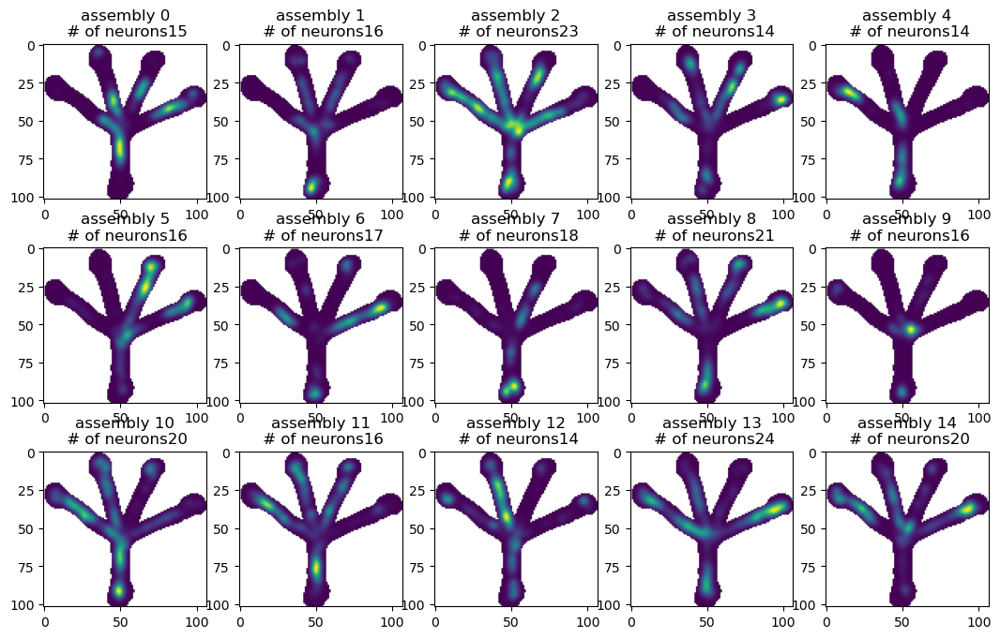

In [426]:
row_num = int(np.ceil(len(np.unique(neurons_labels_all_assembly))/5))
fig, axes = plt.subplots(row_num,5, figsize = (13,8 * row_num/3), squeeze = True)

# sum each assembly's place field
for assembly in np.unique(neurons_labels_all_assembly):
    cell_list_assembly = [cell_list_nonan[u] for u in neurons_ind_all_assembly[neurons_labels_all_assembly == assembly]]
    weights = np.array([ic_vectors[int(assembly)][u] for u in neurons_ind_all_assembly[neurons_labels_all_assembly == assembly]])
    #cell_list_assembly = cell_list_nonan
    #weights = ic_vectors[int(assembly)]
    weights = weights / np.sum(weights)

    place_fields_list = []
    
    for p in np.arange(len(cell_list_assembly)):
        
        (e,u) = cell_list_assembly[p]
        weight = weights[p]
        try:
            place_fields_list.append(placefields[(e,u)] * weight)
        except:
            pass
    all_place_fields_sum = np.array(place_fields_list)
    all_place_fields_sum = np.sum(all_place_fields_sum, axis = 0)
    
    axes[np.unravel_index(int(assembly), axes.shape)].imshow(all_place_fields_sum)
    axes[np.unravel_index(int(assembly), axes.shape)].set_title("assembly "+str(int(assembly)) +
                                                                "\n # of neurons" + str(len(weights)))


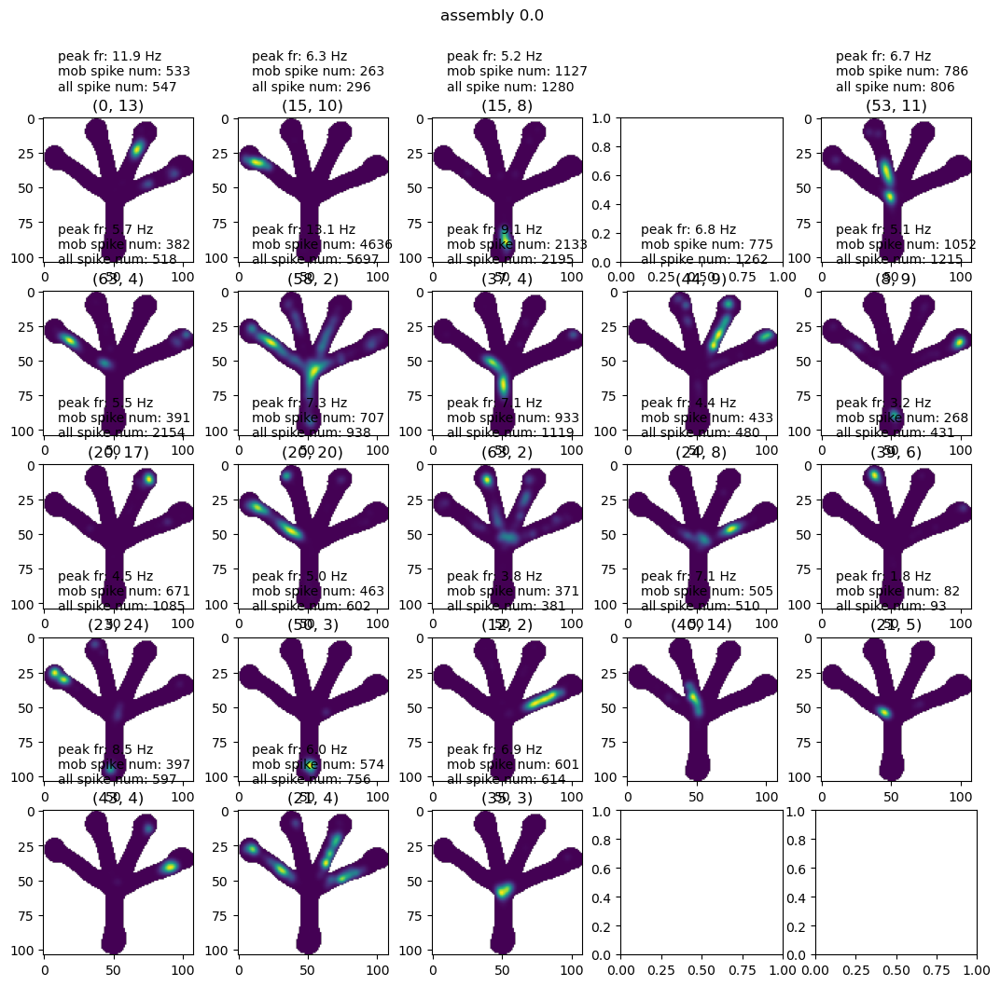

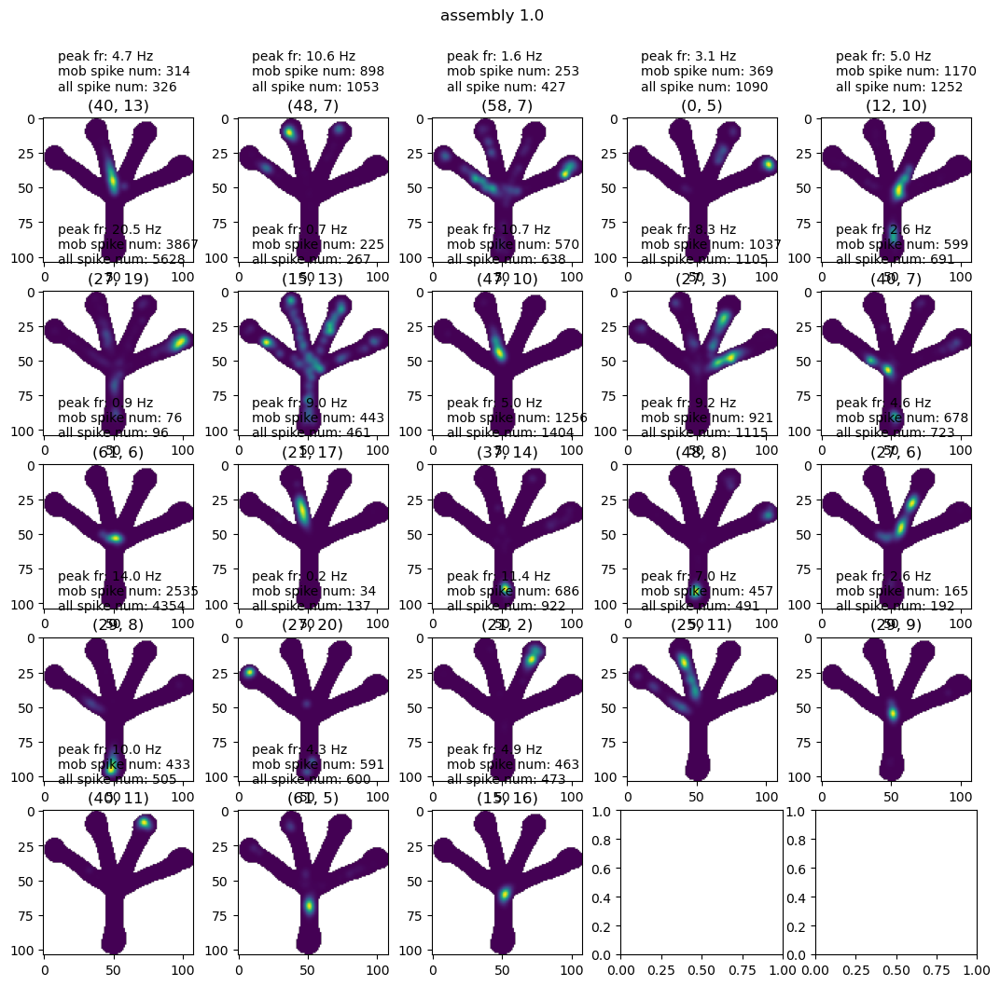

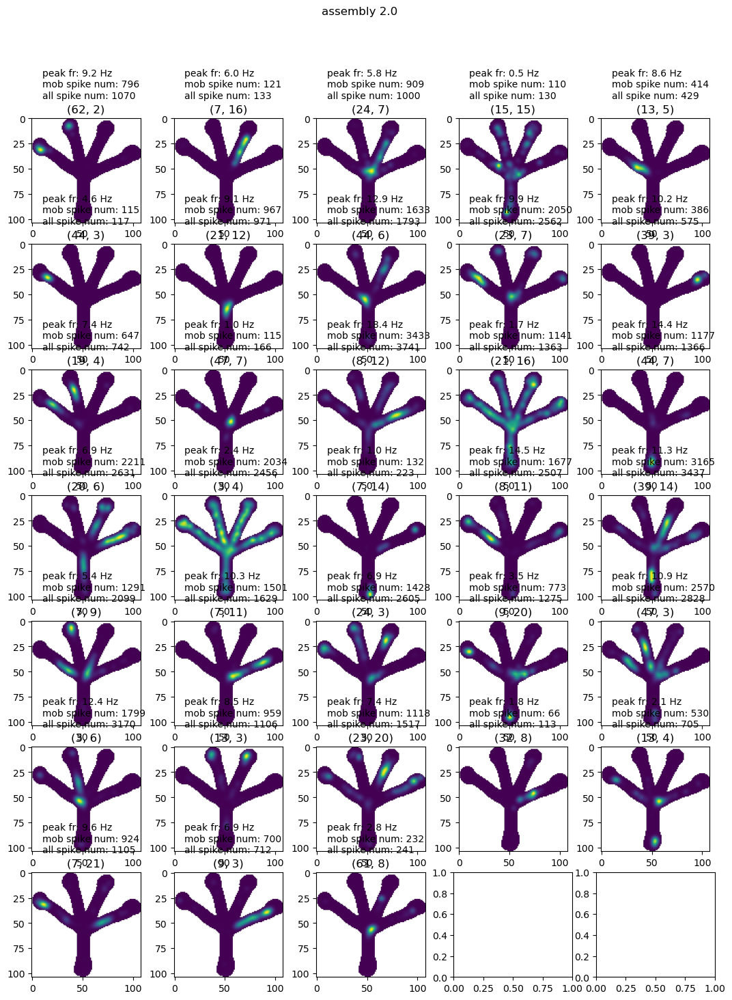

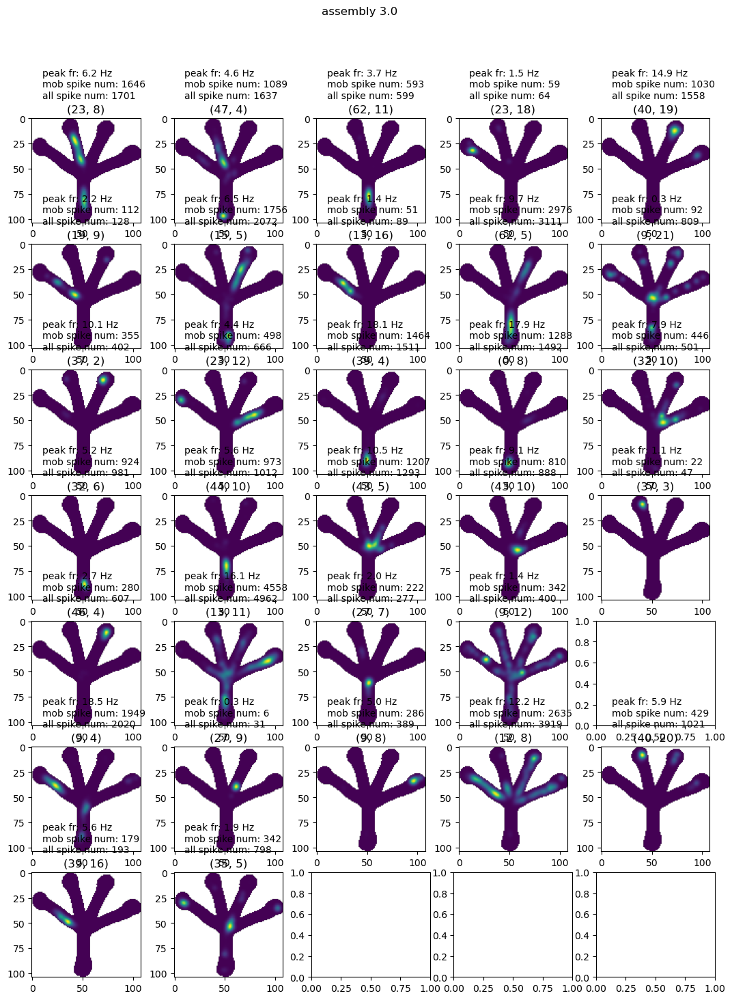

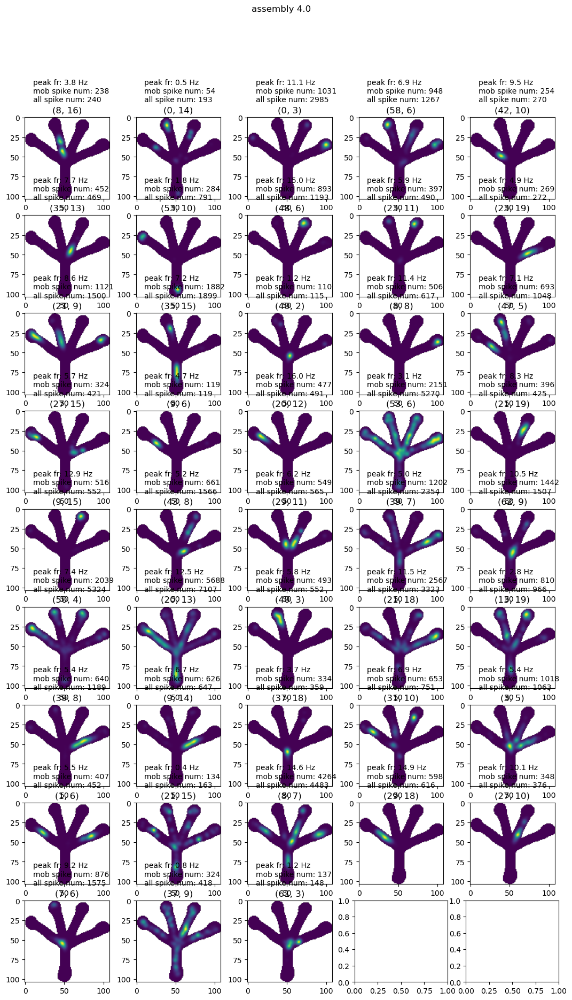

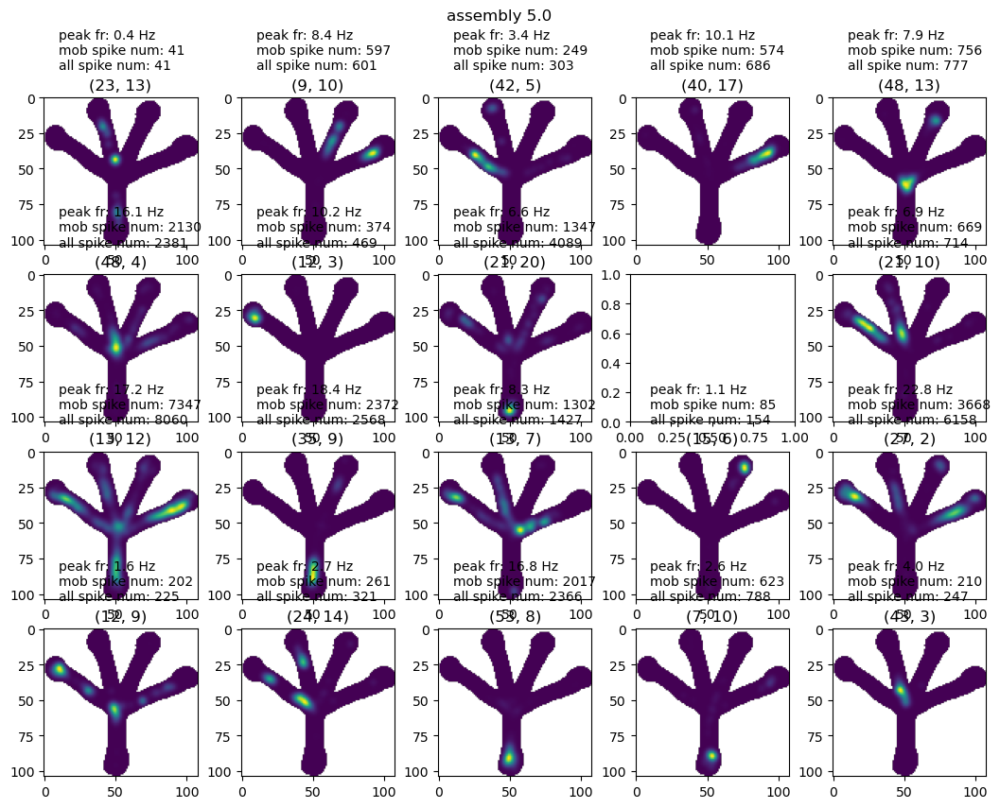

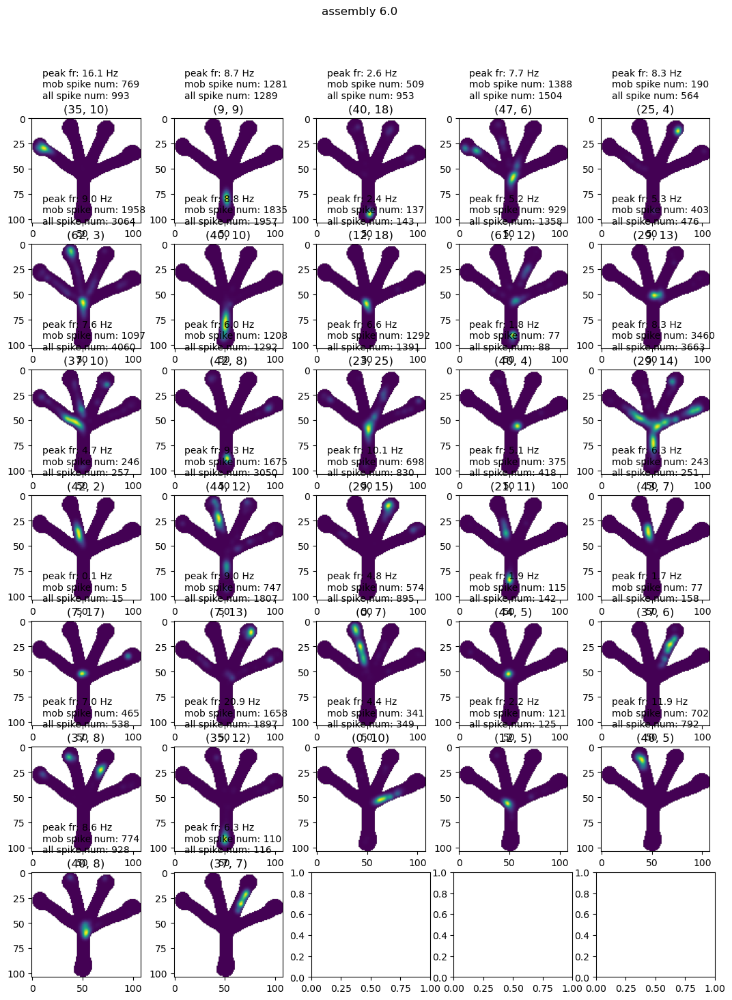

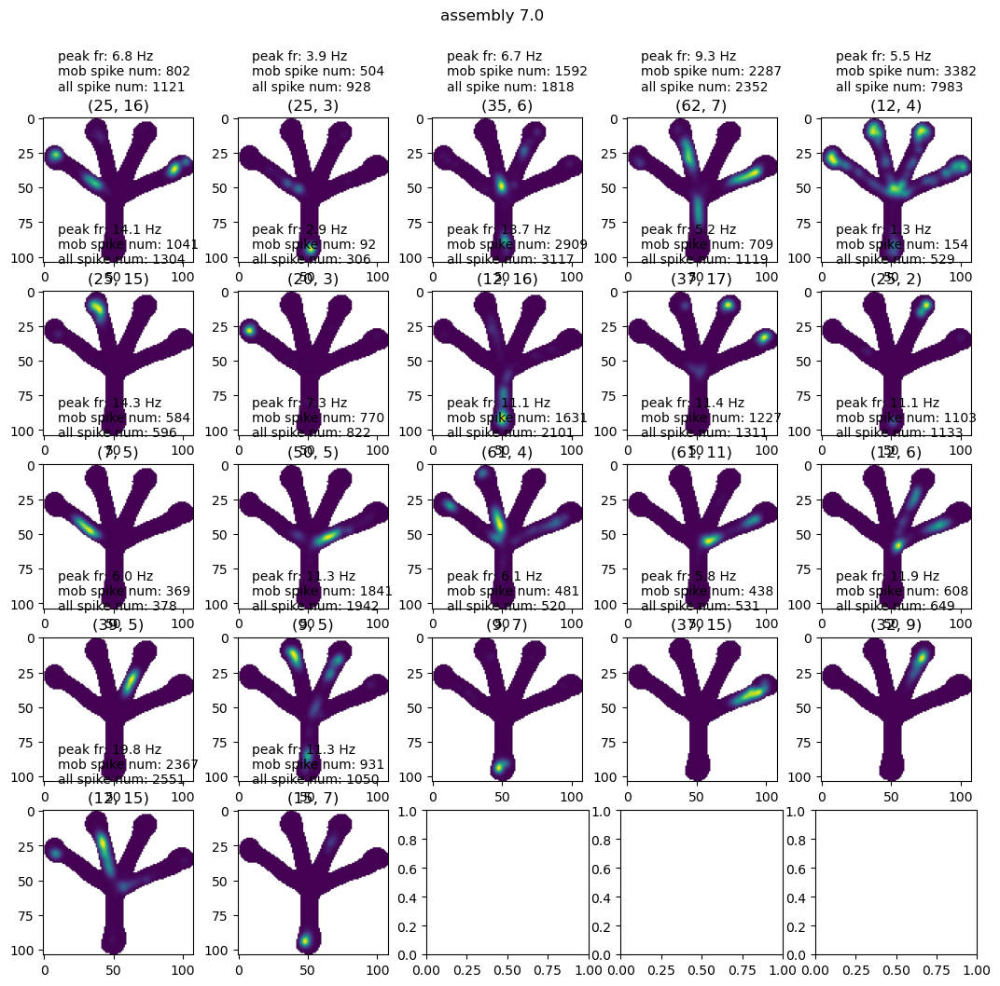

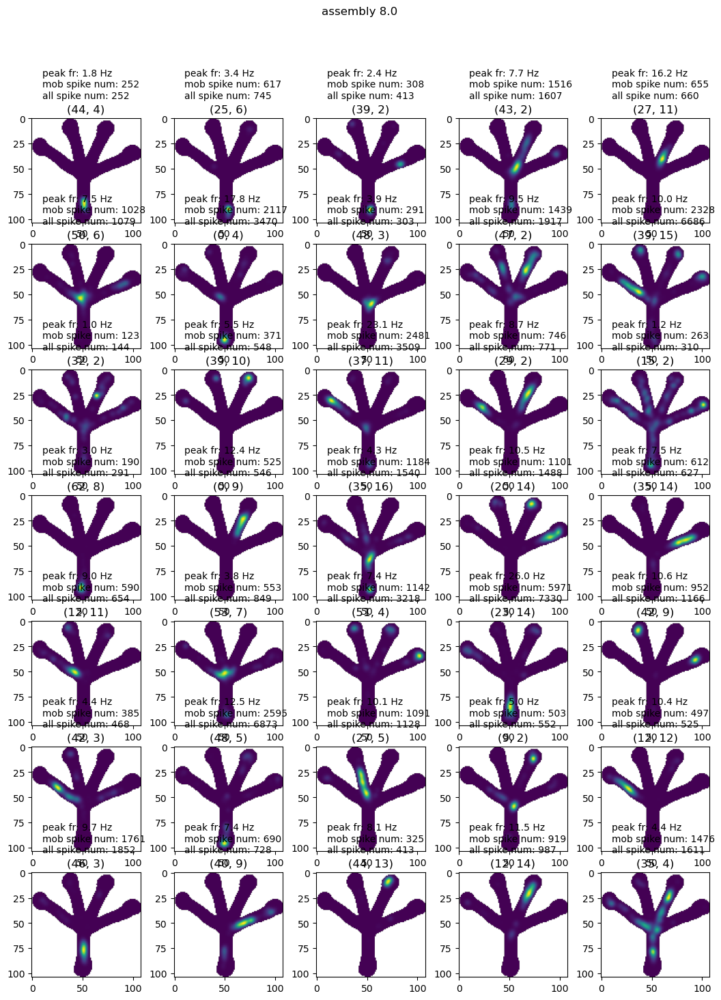

In [221]:
# each assembly plot its assembly neurons
for assembly in np.unique(neurons_labels_all_assembly):
    cell_list_assembly = [cell_list_nonan[u] for u in neurons_ind_all_assembly[neurons_labels_all_assembly == assembly]]
    
    row_num = int(np.ceil(len(cell_list_assembly)/5))
    fig, axes = plt.subplots(row_num,5, figsize = (13,7 * row_num/3), squeeze = True)

    ind = 0
    for p in np.arange(len(cell_list_assembly)):
        
        (e,u) = cell_list_assembly[p]
        try:
            axes[np.unravel_index(ind, axes.shape)].imshow(placefields[(e,u)])
            axes[np.unravel_index(ind, axes.shape)].set_title(str((e,u)))
            axes[np.unravel_index(ind, axes.shape)].text(10,-20,"peak fr: "+str(round(peak_frs[(e,u)],1))+" Hz \n" + 
                                                     "mob spike num: "+str(mobility_spike_counts[e,u]) + "\n" +
                                                     "all spike num: "+str(all_spike_counts[e,u]))
        except:
            pass
        
        ind = ind + 1
    
    for p in np.arange(ind, 10):
        axes[np.unravel_index(p, axes.shape)].set_axis_off()
    plt.suptitle("assembly " + str(assembly))

### Spectral Cluster in time direction

In [275]:
'''then use sklearn package'''
from sklearn.manifold import SpectralEmbedding

embedding = SpectralEmbedding(n_components=4,affinity='nearest_neighbors',n_neighbors=50) #n_neighbors=10
X_transformed = embedding.fit_transform(R)
X_transformed.shape

(3671, 4)

In [246]:
N = embedding.affinity_matrix_.toarray()
N_reorders,arm_breaks = reorder_affinity_by_arm(N,arm,linearized_location)

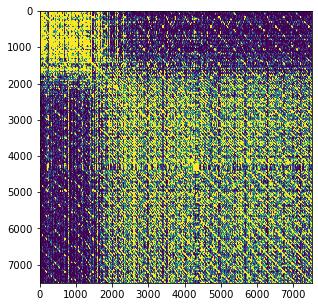

In [247]:
%matplotlib inline
fig,axes=plt.subplots(1,1,figsize=(5,5))
plt.imshow(N,vmax=0.01,interpolation='bilinear', rasterized=False)

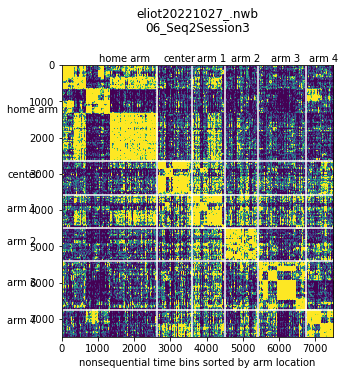

In [248]:
%matplotlib inline
fig,axes=plt.subplots(1,1,figsize=(5,5))
plt.imshow(N_reorders,vmax=0.01,interpolation='bilinear', rasterized=False)
arms_name = ['home arm','center','arm 1','arm 2','arm 3','arm 4']
a_ind=0
for a_ind in range(len(arms_name)):
    b = arm_breaks[a_ind]
    plt.axvline(b,color='w')
    plt.axhline(b,color='w')
    plt.text(-1500,0.5*(b+arm_breaks[a_ind+1]),arms_name[a_ind])
    plt.text(0.5*(b+arm_breaks[a_ind+1])-300,-100,arms_name[a_ind])
axes.set_xlabel('nonsequential time bins sorted by arm location')
figureName=nwb_copy_file_name+'_'+session_name
plt.title(nwb_copy_file_name+'\n'+session_name,y=1.1)
plt.savefig(outputFolder+figureName+'.png', dpi=300,bbox_inches='tight')
plt.savefig(outputFolder+figureName+'.pdf', dpi=300,bbox_inches='tight')

In [276]:
# color code by arms
color_palet[0,:] = [0.5,0.5,0.5]
color_palet[5,:] = [0.6,0.2,0.2]
colors_arm=[]
for t_ind in range(R.shape[0]):
    colors_arm.append(color_palet[arm[t_ind],:])

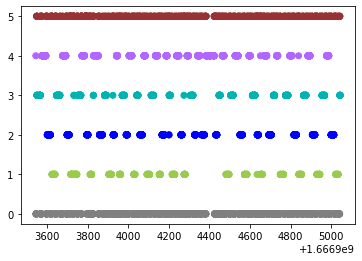

In [277]:
%matplotlib inline
plt.scatter(time_axis,arm,color=colors_arm)

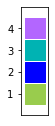

In [199]:
fig,axes=plt.subplots(1,1,figsize=(0.5,2))
for i in range(1,5):
    plt.scatter(1,i,color=color_palet[i,:],s=400,marker='s');
axes.get_xaxis().set_ticks([]);
plt.ylim(0, 5)
axes.get_yaxis().set_ticks([1,2,3,4]);

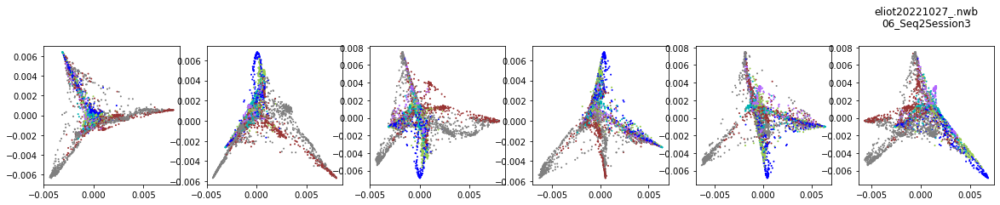

In [278]:
%matplotlib inline

fig,axes=plt.subplots(1,6,figsize=(20,3))

axes[0].scatter(X_transformed[:,0],X_transformed[:,1],color=colors_arm,s=1)
axes[1].scatter(X_transformed[:,0],X_transformed[:,2],color=colors_arm,s=1)
axes[2].scatter(X_transformed[:,0],X_transformed[:,3],color=colors_arm,s=1)
axes[3].scatter(X_transformed[:,1],X_transformed[:,2],color=colors_arm,s=1)
axes[4].scatter(X_transformed[:,1],X_transformed[:,3],color=colors_arm,s=1)
axes[5].scatter(X_transformed[:,2],X_transformed[:,3],color=colors_arm,s=1)

figureName=nwb_copy_file_name+'_'+session_name+'_Laplacian'
plt.title(nwb_copy_file_name+'\n'+session_name,y=1.1)
plt.savefig(outputFolder+figureName+'.png', dpi=300,bbox_inches='tight')
plt.savefig(outputFolder+figureName+'.pdf', dpi=300,bbox_inches='tight')


### Color result by time

In [318]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize

colors=[]
for t_ind in range(len(time_axis)-1):
    colors.append(cm.jet(t_ind/len(time_axis)))

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


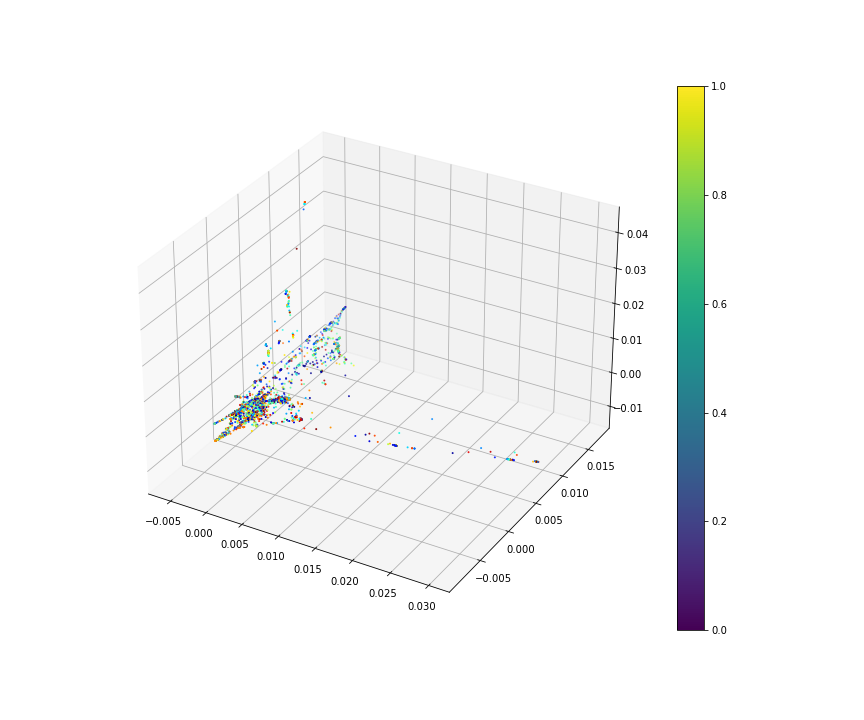

In [319]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,0],X_transformed[:,1],X_transformed[:,2],color=colors,s=1)
plt.colorbar(plot)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


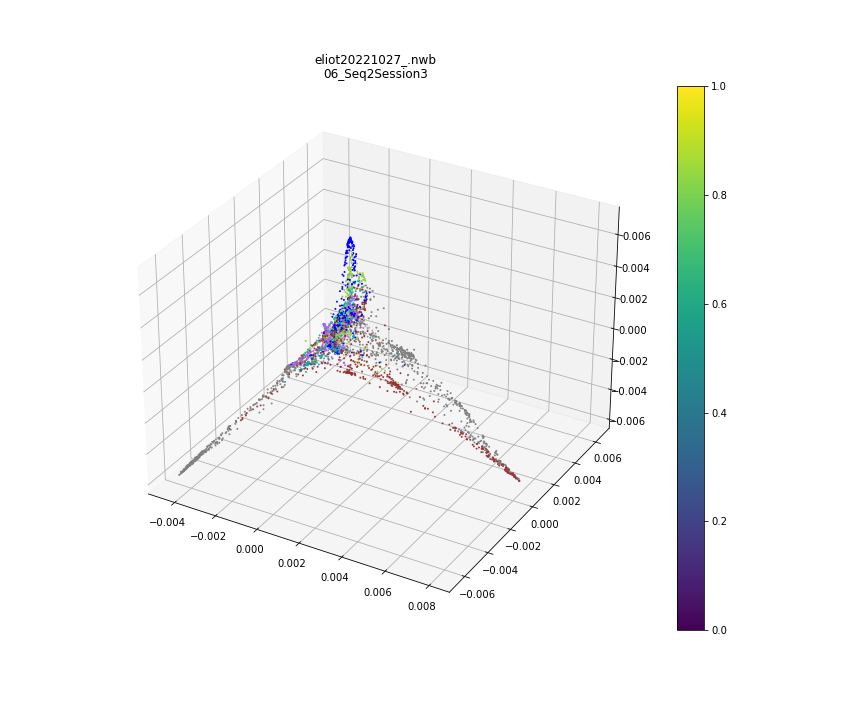

In [279]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,0],X_transformed[:,1],X_transformed[:,2],color=colors_arm,s=1)
plt.colorbar(plot)

figureName=nwb_copy_file_name+'_'+session_name+'_Laplacian3D'
plt.title(nwb_copy_file_name+'\n'+session_name,y=1.1)
plt.savefig(outputFolder+figureName+'.png', dpi=300,bbox_inches='tight')
plt.savefig(outputFolder+figureName+'.pdf', dpi=300,bbox_inches='tight')

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


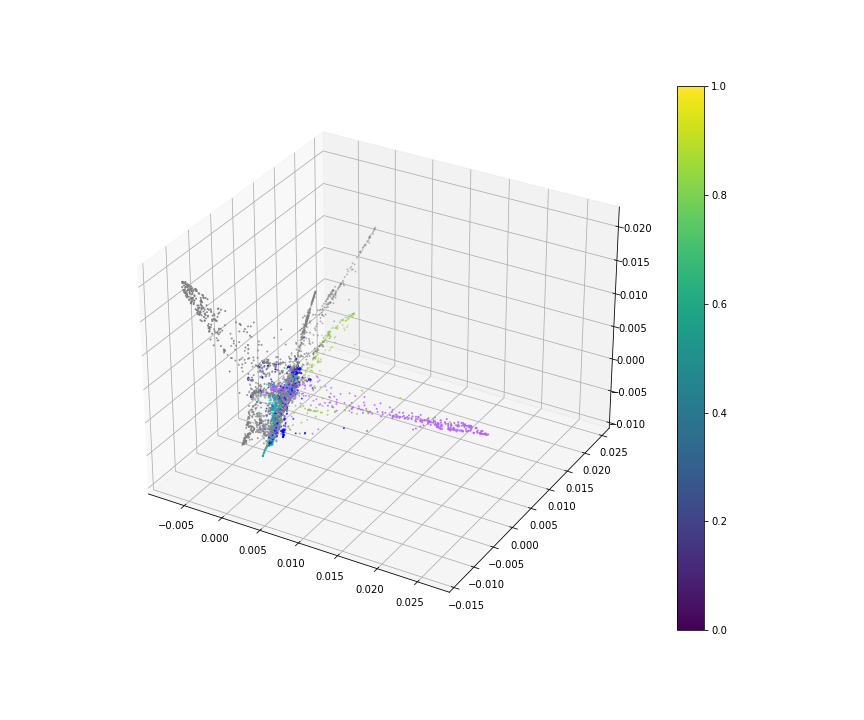

In [596]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,1],X_transformed[:,2],X_transformed[:,3],color=colors_arm,s=1)
plt.colorbar(plot)

#### (2) Find cell groups

In [409]:
loading = X_transformed.T @ R

In [410]:
C_embedding = SpectralEmbedding(n_components=3,affinity='nearest_neighbors',n_neighbors=10)
C_transformed = C_embedding.fit_transform(loading.T)
C_transformed.shape

(63, 3)

In [411]:
order = []
cell_group = np.argmax(C_transformed.T,axis=0)
for g in range(C_transformed.shape[1]):
    subordering = np.argsort(-C_transformed[cell_group == g,g])
    order.append(np.argwhere(cell_group == g).ravel()[subordering])
cell_ind=np.hstack(order)
block_boundary=np.argwhere(np.diff(cell_group[cell_ind])).ravel()+1

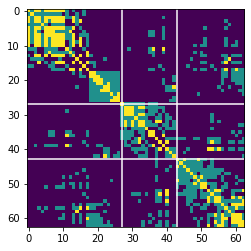

In [412]:
N = C_embedding.affinity_matrix_.toarray() #np.cov(R.T)
plt.imshow(N[cell_ind][:,cell_ind])
for b in block_boundary:
    plt.axvline(b,color='w')
    plt.axhline(b,color='w')

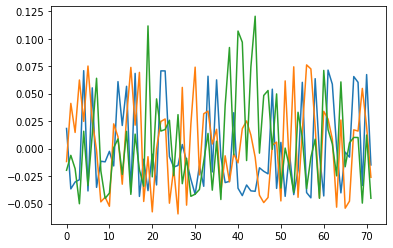

In [152]:
plt.plot(C_transformed)

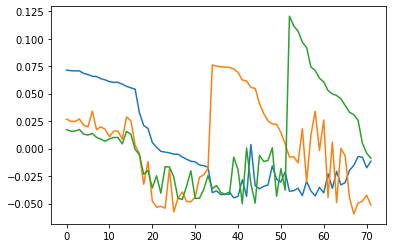

In [153]:
plt.plot(C_transformed[cell_ind,:])

### UMAP

In [280]:
R.shape

(3671, 72)

In [281]:
import umap
reducer = umap.UMAP(n_neighbors=40,min_dist=0.3,n_components=3,metric='cosine') #local_connectivity=15, #40 for early learning
embedding = reducer.fit_transform(R)
embedding.shape

(3671, 3)

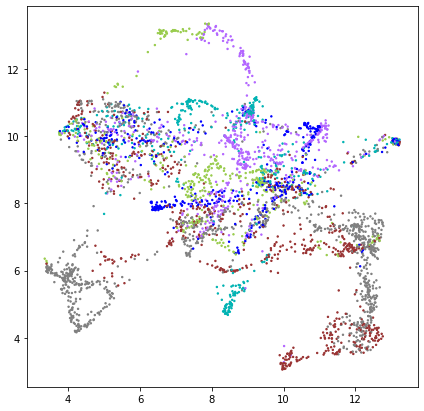

In [282]:
%matplotlib inline

fig,axes=plt.subplots(1,1,figsize=(7,7))

axes.scatter(embedding[:,0],embedding[:,1],color=colors_arm,s=2)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


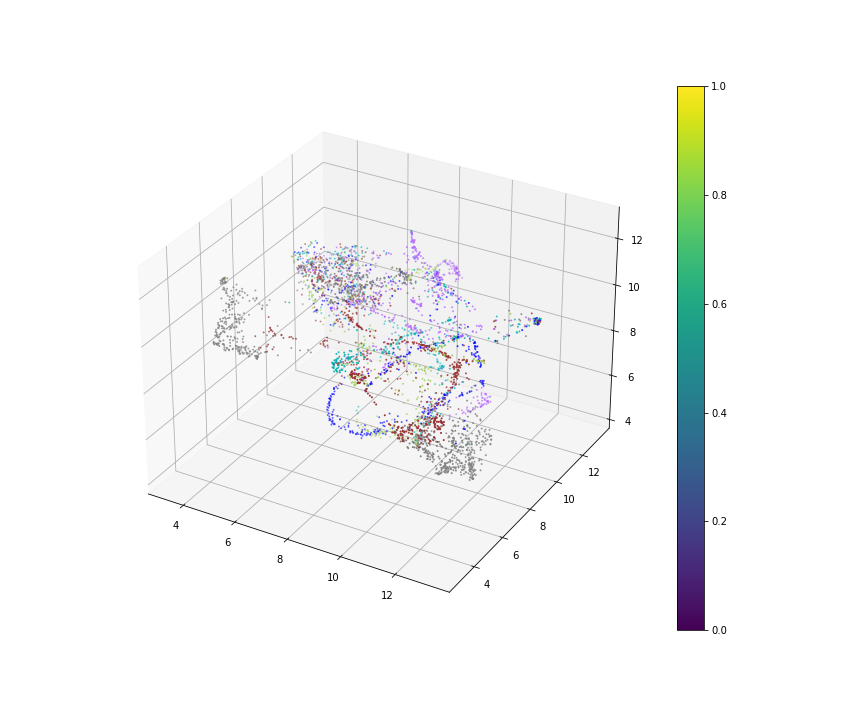

In [283]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(embedding[:,0],embedding[:,1],embedding[:,2],color=colors_arm,s=1)
plt.colorbar(plot)

In [284]:
import umap
reducer = umap.UMAP(n_neighbors=50,min_dist=0.25,metric='cosine',output_metric='haversine',n_components=2) #min_dist=0.2 #local_connectivity=15
embedding = reducer.fit_transform(R)
embedding.shape

(3671, 2)

In [285]:
x = np.sin(embedding[:, 0]) * np.cos(embedding[:, 1])
y = np.sin(embedding[:, 0]) * np.sin(embedding[:, 1])
z = np.cos(embedding[:, 0])

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


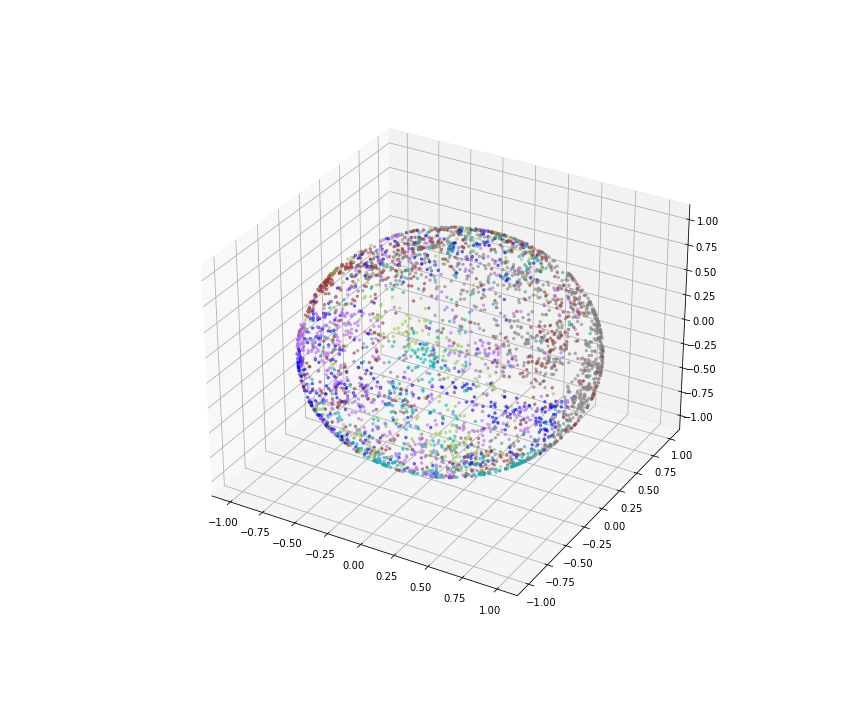

In [286]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

ax.scatter(x,y,z,color=colors_arm,s=6,alpha=0.5)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


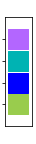

In [603]:
fig,axes=plt.subplots(1,1,figsize=(0.5,2))
for i in range(1,5):
    plt.scatter(1,i,color=color_palet[i,:],s=400,marker='s');
axes.get_xaxis().set_ticks([]);
plt.ylim(0, 5)
axes.get_yaxis().set_ticks([1,2,3,4]);

In [ ]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,0],X_transformed[:,1],X_transformed[:,2],color=colors_arm,s=1)
plt.colorbar(plot)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


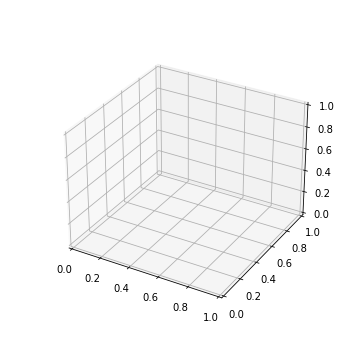

In [50]:
%matplotlib notebook
#widget
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
import time

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')

def animation(i):
    ax.scatter(X_transformed[i,1],X_transformed[i,2],X_transformed[i,3],color='k')
    
ani = FuncAnimation(fig, animation, frames=len(X_transformed[:,1]),interval=20)
plt.show()


## END HERE

### Spectrial Clustering in cell direction

In [440]:
## unused
'''then use sklearn package'''
from sklearn.manifold import SpectralEmbedding

embedding = SpectralEmbedding(n_components=10,affinity='nearest_neighbors',n_neighbors=10)
X_transformed = embedding.fit_transform(R.T)
X_transformed.shape

def pick_high_ind(value):
    # also in the order of descending value
    sort_ind = np.argsort(-value)
    return sort_ind[value[sort_ind]>=np.quantile(value,0.95)]

ind = []
arm_ind=[]
for i in range(10):
    ind.append(pick_high_ind(embedding.embedding_[:,i]))
    arm_ind.append(np.ones(len(pick_high_ind(X_transformed[:,i])))*i)
ind=np.concatenate(ind)
arm_ind=np.concatenate(arm_ind)

_, idx = np.unique(ind, return_index=True)
ind = ind[np.sort(idx)]
arm_ind_ = arm_ind[np.sort(idx)]

arm_breaks=np.argwhere(np.diff(arm_ind_)).ravel()+1
arm_breaks=np.concatenate(([0],arm_breaks))

N=embedding.affinity_matrix_.toarray()
N_=N[ind,:]
N_=N_[:,ind]
%matplotlib inline
fig,axes=plt.subplots(1,1,figsize=(5,5))
plt.imshow(N_)
for b in arm_breaks:
    plt.axvline(b,color='w')
    plt.axhline(b,color='w')

(51, 10)